# Import and function definition

In [1]:
from math import ceil
from pathlib import Path
from collections import Counter
import textwrap

import pandas as pd
import joblib
import os 
import glob
import matplotlib
import matplotlib.pyplot as plt
from pprint import pprint

import numpy as np
%matplotlib notebook

figure_folder = Path('figures')

In [2]:
import matplotlib
family_font = "Latin Modern Roman"
matplotlib.rc('font',family=family_font)
titlefont = dict(fontweight='bold', fontname=family_font)
legendfont =dict(fontname=family_font)
matplotlib.rcParams['pdf.fonttype'] = 42
std_figsize=(5, 4)

## Loader

In [3]:
def open_simulation_files(simulation_folder):
#     pprint(os.path.join(simulation_folder, 'test_record.jbl'))
    test = joblib.load(os.path.join(simulation_folder, 'test_record.jbl'))
    simulation = joblib.load(os.path.join(simulation_folder, 'simulation_params.jbl'))
    goal_sampler = joblib.load(os.path.join(simulation_folder, 'goal_sampler_record.jbl'))    
    # log = joblib.load(os.path.join(simulation, 'log.log'))
    return test, simulation, goal_sampler

def load_simulation(simulation):
    test_record, simulation_params, goal_sampler_record = open_simulation_files(simulation)
    episodes = list(test_record.keys())
    flattened_record = flatten(test_record)
#     pprint(test_record)

    goal_records = goal_sampler_record['goals_record']
    reached_counter = {k:v['reached_counter'] for k,v in goal_records.items()}
    target_counter = {k:v['target_counter'] for k,v in goal_records.items()}
    discovery_records = {k:v['iter_discovery'] for k,v in goal_records.items()}
    return flattened_record, reached_counter, target_counter, discovery_records, episodes

def load_simulation_list(simulation_list, agg=True, use_error=False, rolling_window=3):
#     pprint(simulation_list)
    print(simulation_list[0], len(simulation_list))
    flattened_records = []
    reached_counters = {}
    target_counters = {}
    discovery_records = {}
    for simulation in simulation_list:
        test_records, reached, target, discovery, ep = load_simulation(simulation)
        df = pd.DataFrame(test_records, index=ep)
        if ep[1] - ep[0] != 10: # [100, 300]:
#         if True:
#             if rolling_window is not None:
#                 print(simulation, ep[1] - ep[0])
#                 if ep[1] - ep[0] == 50:
#                     df = df.rolling(window=6, min_periods=1).mean()
#             if ep[1] - ep[0] == 100:
#                 df = df.rolling(window=3, min_periods=1).mean()
#                 else:
#                     print(f"no rolling mean for {simulation}")
            df.rename_axis(index='episode', columns='instruction', inplace=True)
            flattened_records.append(df)
            for k in reached.keys():
                try:
                    reached_counters[k].append(reached[k])
                    target_counters[k].append(target[k])
                    discovery_records[k].append(discovery[k])
                except KeyError:
                    reached_counters[k] = [reached[k]]
                    target_counters[k] = [target[k]]
                    discovery_records[k] = [discovery[k]]
                    
    df_records = pd.concat(flattened_records, axis=1, keys=simulation_list, names=['simulation'])
    if isinstance(rolling_window, int):
        df_records = df_records.rolling(window=rolling_window, min_periods=1).mean()
    df_records.columns = df_records.columns.reorder_levels([1, 0])
    df_records_groupby = df_records.groupby(level='instruction', axis=1, dropna=True)
    if agg:
        df_mean, df_std, df_sem = df_records_groupby.mean(), df_records_groupby.std(), df_records_groupby.sem()
        df_std = df_sem if use_error else df_std
        return df_mean, df_std, reached_counters, target_counters, discovery_records
    else:
        return df_records, df_records_groupby, reached_counters, target_counters, discovery_records


### Utils

In [4]:
def flatten(d):
    deal_with_overall_results(d)
    def aux(d, out):
        for k,v in d.items():
            if isinstance(v, dict):
                aux(v, out)
            else:
                try:
                    out[k].append(v)
                except KeyError:
                    out[k] = [v]
                    
    out = {}
    for val in d.values():
        if isinstance(val, dict):
            aux(val, out)
    return out

def replace_key(d, key, replace_by):
    try:
        v = d.pop(key)
        d[replace_by] = v
    except KeyError:
        pass
    

def deal_with_overall_results(d):
    thing_list = list(list(d.values())[0].keys())
    for v in d.values():
        for t in thing_list:
            if 'overall' not in t:
                replace_key(v[t], 'overall', f'overall_{t}')
            

## Plot functions

### Utils

In [5]:
def incr_ij(i,j, ncols):
    if j == ncols - 1:
        return i+1, 0
    else:
        return i, j+1
    
def get_idx(n_fig, ncols):
    i,j = 0,0
    idx=[]
    for k in range(n_fig):
        idx.append((i,j))
        i, j = incr_ij(i,j,ncols)
    return idx

def hide_empty_subplots(fig):
    for ax in fig.axes:
        if not ax.has_data():
            ax.set_visible(False)

def post_process_fig_font(fig, title, x_label, y_label, fontsize=12, legend=False, xlim=None, legend_names=None):
    ax = fig.gca()
    ax.set_ylim(0, 1.025)
    if xlim:
        ax.set_xlim(0, xlim)
    if legend:
        L = ax.legend(labels=legend_names, fontsize=12)
#         plt.setp(L.texts, family=legendfont['fontname'])
    ax.set_title(title, **titlefont)
    ax.set_xlabel(x_label, fontname=legendfont['fontname'], fontsize=12)
    ax.set_ylabel(y_label, fontname=legendfont['fontname'], fontsize=12)   
    for tick in ax.get_xticklabels():
        tick.set_fontname(legendfont['fontname'])
    for tick in ax.get_yticklabels():
        tick.set_fontname(legendfont['fontname'])

def save_fig(fig, name):
    fig.savefig(figure_folder / name, bbox_inches='tight')


### Inside functions

In [6]:
def prepare_figures(keys, ncols=3, figsize=None, sharex=True, sharey=False, axes_as_dict =True):
    ncols = min(ncols, len(keys))
    nline = ceil(len(keys) / ncols)
    if figsize is None:
        figsize=(ncols * std_figsize[0], nline * std_figsize[1])
        
    fig, axes = plt.subplots(nline, ncols, figsize=figsize, sharex=sharex, sharey=sharey)
    plt.subplots_adjust(hspace=0.6)
    if axes_as_dict:
        if len(keys) == 1:
            axes = [axes]
        else:
            axes = axes.flatten()
            
        axes = {k: ax for k, ax in zip(sorted(keys), axes)}
    return fig, axes

def plot_mean_std(ax, mean, std, label, color, title, xlim, legend=True):
    mean.plot(ax=ax, label=label, color=color, title=title, legend=legend)
    if std is not None:
        ax.fill_between(mean.index, (mean-std).clip(0,1), (mean+std).clip(0,1), alpha=0.4, color=color, linewidth=0)
    ax.set_ylim(0, 1.01)
    if xlim:
        ax.set_xlim(0, xlim)
        
def display_goal_sampler_info(ax, reached, discovery):
    ax.text(1, 0.85, f'pos. ex:{reached} \n'
                     f'disc:{discovery}',
        horizontalalignment='right',
        verticalalignment='bottom',
        transform=ax.transAxes)
    
def plot_multi_success_rates(df_mean, axes, reached_counter=None, iter_discovery=None, 
                               std_record=None, goal_sampler_info=False, name='', color=None, xlim=None, legend=False):
    std_record = {k: None for k in axes.keys()} if std_record is None else std_record
    for k in axes.keys():
        title = '\n'.join(textwrap.wrap(k, 25))
        plot_mean_std(ax=axes[k], mean=df_mean[k], std=std_record[k], label=name, color=color, 
             title=title, xlim=xlim, legend=legend)
        if goal_sampler_info and reached_counter.get(k, None) is not None:
            display_goal_sampler_info(ax=axes[k], reached=reached_counter[k], discovery=iter_discovery[k])

### Plot functions

In [7]:
def compare_average_success_rate(*folders, xlim=None, keep_fig=None, title='', legend=True, use_error=False, rolling_window=None):
    """
    each folders should be a tuple (name, path), path is a list of simulation records path and name is the simulation name
    """
    keys_counter = Counter()
    all_records = dict()
    for (name, f) in folders:
        df_mean, df_std, _,_,_ = load_simulation_list(f, use_error=use_error, rolling_window=rolling_window)        
        keys_counter.update(df_mean.columns)
        all_records.update({name: (df_mean, df_std)})
    
    keep_fig = list(keys_counter.keys()) if keep_fig is None else keep_fig
    fig, axes = prepare_figures(keep_fig)
    print(axes)
    for (name, (df_mean, df_std)), i in zip(all_records.items(), range(len(all_records))):
        plot_multi_success_rates(df_mean=df_mean, std_record=df_std, axes=axes,
                                   goal_sampler_info=False, name=name, color=f'C{i}', xlim=xlim)    
    if legend:
        handles, labels = axes[keys_counter.most_common(1)[0][0]].get_legend_handles_labels()
        fig.legend(handles, labels, loc='upper right', fontsize=12)
        fig.suptitle(title)
    hide_empty_subplots(fig)
    return fig, axes

    
def plot_goal_record(reached_counter, target_counter):
    ind = np.arange(len(goal_records))  # the x locations for the groups
    width = 0.2     # the width of the bars

    fig, ax = plt.subplots(figsize=(20,5))
    ax.bar(ind, reached_counter.values(),width, color='r', label = 'reached_counter')
    ax.bar(ind+width, target_counter.values(),width, color='g', label = 'target_counter')

    ax.set_xticks(ind + width)
    ax.set_xticklabels(goal_records.keys())
    plt.setp(ax.get_xticklabels(), rotation=30, horizontalalignment='right', fontsize='x-small')
    
    ax.legend()
    fig.tight_layout()
    
def load_and_plot(path, xlim=None, keep_fig=None):
    df_mean, df_std, reached_counters, target_counters, discovery_records = load_simulation_list(path)
    reached_averaged = {k: (np.round(np.nanmean(v)),np.round(np.std(v), 1)) for k,v in reached_counters.items()}
    average_discovery = {k: (np.round(np.nanmean(v)),np.round(np.std(v), 1)) for k,v in discovery_records.items()}
       
    fig, axes = prepare_figures(list(df_mean.columns.values))
    plot_multi_success_rates(df_mean=df_mean, axes=axes, goal_sampler_info=True,
                       reached_counter=reached_averaged, iter_discovery=average_discovery, 
                       std_record=df_std, xlim=xlim, legend=False)
    hide_empty_subplots(fig)
#     post_process_fig_font(fig=fig,title='', x_label='Episode', y_label='Taux de succès', legend=False)
    
def plot_on_one_fig(path, names, xlim=None, legend_names=None, use_error=False, rolling_window=None):
    legend_names = names if legend_names is None else legend_names
    df_mean, df_std, reached_counters, target_counters, discovery_records = load_simulation_list(path, use_error=use_error, rolling_window=rolling_window)
    reached_averaged = {k: (np.round(np.nanmean(v)),np.round(np.std(v), 1)) for k,v in reached_counters.items()}
    average_discovery = {k: (np.round(np.nanmean(v)),np.round(np.std(v), 1)) for k,v in discovery_records.items()}
    
    fig, axes = plt.subplots(figsize=std_figsize)
#     plt.subplots_adjust(hspace=0.6)    
    for k in names:
        i = names.index(k)
        plot_mean_std(ax=axes, mean=df_mean[k], std=df_std[k], label=legend_names[i], color=f'C{i}', xlim=xlim, title=None, legend=False)
    post_process_fig_font(fig=fig, title='', x_label='Episodes', y_label='Taux de succès', legend=len(names) > 1)
    return fig, axes
    
def plot_all_sim(path, xlim=None, keep_fig=None, rolling_window=3, use_error=False):
    df_records, df_records_groupby, _, _, _ = load_simulation_list(path, agg=False, rolling_window=rolling_window, use_error=use_error)       
    keep_fig = list(df_records.columns.get_level_values('instruction').values) if keep_fig is None else keep_fig
    fig, axes = prepare_figures(keep_fig)
#     df_records_groupby.plot(ax=axes.flatten())
    print(axes)
    for k in axes.keys():
        print(k)
        df_records_groupby.get_group(k).plot(ax=axes[k])
        axes[k].set_title(k)
#     plot_multi_success_rates(df_mean=df_records_groupby, axes=axes, std_record=None, xlim=xlim, legend=False)
    hide_empty_subplots(fig)
    post_process_fig_font(fig=fig, title='', x_label='Episodes', y_label='Taux de succès', legend=False)
    return fig, axes

# Plot one simulation

In [17]:
# simulation_name = 'two_simple'
# simulation_name = 'simple_alwayson'
simulation_name = 'adorne'
# simulation_name = 'bigass'
folders = glob.glob(f'results/thesis_sim/DoubleAttentionContext/simulation_{simulation_name}*')
print(folders)

['results/thesis_sim/DoubleAttentionContext/simulation_adorne_1', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_2', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_7', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_5', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_3', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_9', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_4', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_6', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_0', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_8']


['results/simulation_two_simple_5',
 'results/simulation_two_simple_0',
 'results/simulation_two_simple_4',
 'results/simulation_two_simple_6',
 'results/simulation_two_simple_7',
 'results/simulation_two_simple_1',
 'results/simulation_two_simple_3',
 'results/simulation_two_simple_2']


<IPython.core.display.Javascript object>


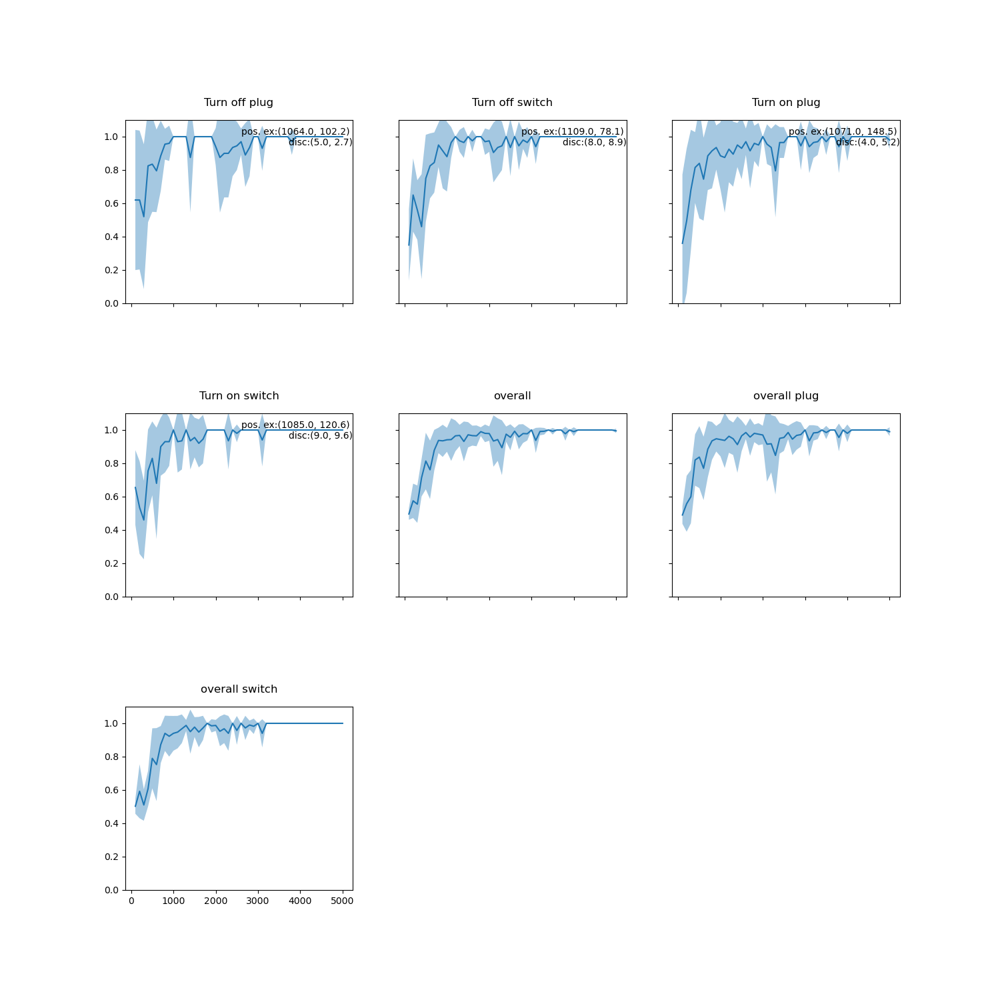

In [12]:
# simulation_name = 'two_simple'
# simulation_name = 'simple_alwayson'
simulation_name = ''
# simulation_name = 'bigass'
# folders = glob.glob(f'results/thesis_sim/twosimple/simulation_{simulation_name}*')
folders = glob.glob(f'results/simulation_two_simple*')

# flattened_records, reached_counters, target_counters, discovery_records, episodes = load_simulation_list(folders)
# reached_averaged = {k: (np.round(np.mean(v)),np.round(np.std(v), 1)) for k,v in reached_counters.items()}
# average_discovery = {k: (np.round(np.mean(v)),np.round(np.std(v), 1)) for k,v in discovery_records.items()}
# average_flattened = {k: np.mean(v, 0) for k,v in flattened_records.items()}
# std_flattened = {k: np.nanstd(v, 0) for k,v in flattened_records.items()}
# fig, axes = plot_average_success_rates(episodes, average_flattened, reached_averaged, std_record=std_flattened, iter_discovery=average_discovery)          
# hide_empty_subplots(fig)

load_and_plot(folders)

'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_0/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_3/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_8/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_1/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_9/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_6/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_7/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_2/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_4/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_5/test_record.jbl'
done


<IPython.core.display.Javascript object>


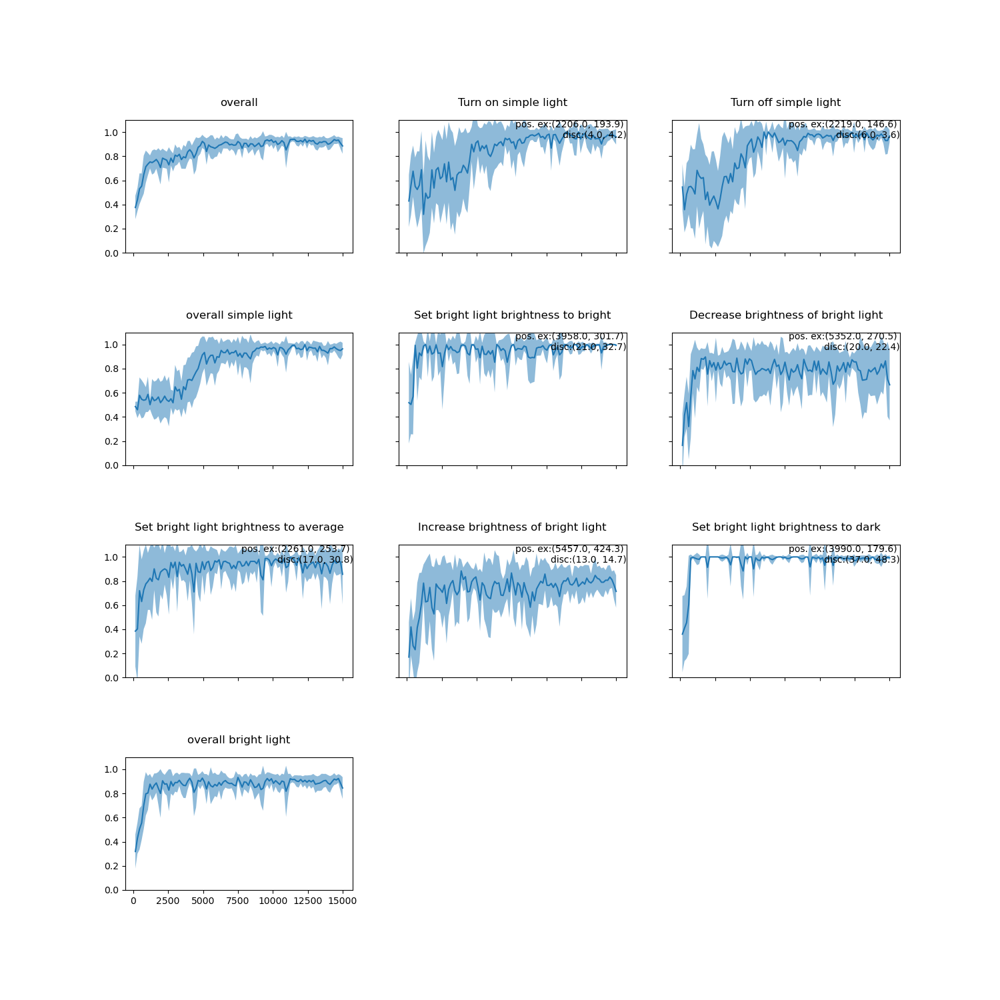

In [20]:
# simulation_name = 'two_simple'
simulation_name = 'simple_alwayson'
# simulation_name = 'adorne'
# simulation_name = 'bigass'
folders = glob.glob(f'results/thesis_sim/DoubleAttentionContext/simulation_{simulation_name}*')
flattened_records, reached_counters, target_counters, discovery_records, episodes = load_simulation_list(folders)
reached_averaged = {k: (np.round(np.mean(v)),np.round(np.std(v), 1)) for k,v in reached_counters.items()}
average_discovery = {k: (np.round(np.mean(v)),np.round(np.std(v), 1)) for k,v in discovery_records.items()}
average_flattened = {k: np.mean(v, 0) for k,v in flattened_records.items()}
std_flattened = {k: np.nanstd(v, 0) for k,v in flattened_records.items()}
fig, axes = plot_average_success_rates(episodes, average_flattened, reached_averaged, std_record=std_flattened, iter_discovery=average_discovery)          
hide_empty_subplots(fig)

<IPython.core.display.Javascript object>


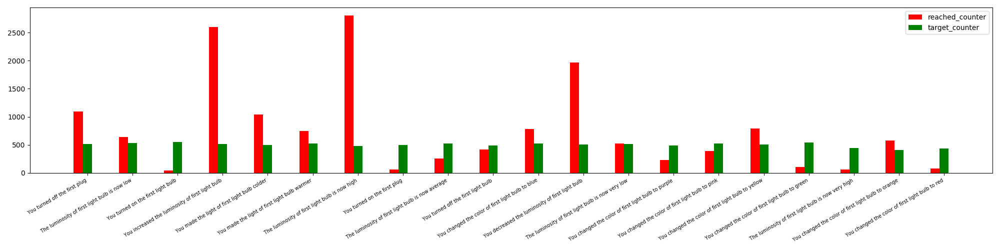

[Text(0, 0, 'You turned off the first plug'), Text(0, 0, 'The luminosity of first light bulb is now low'), Text(0, 0, 'You turned on the first light bulb'), Text(0, 0, 'You increased the luminosity of first light bulb'), Text(0, 0, 'You made the light of first light bulb colder'), Text(0, 0, 'You made the light of first light bulb warmer'), Text(0, 0, 'The luminosity of first light bulb is now high'), Text(0, 0, 'You turned on the first plug'), Text(0, 0, 'The luminosity of first light bulb is now average'), Text(0, 0, 'You turned off the first light bulb'), Text(0, 0, 'You changed the color of first light bulb to blue'), Text(0, 0, 'You decreased the luminosity of first light bulb'), Text(0, 0, 'The luminosity of first light bulb is now very low'), Text(0, 0, 'You changed the color of first light bulb to purple'), Text(0, 0, 'You changed the color of first light bulb to pink'), Text(0, 0, 'You changed the color of first light bulb to yellow'), Text(0, 0, 'You changed the color of firs

In [147]:
plot_goal_record(reached_counter, target_counter)

In [8]:
s = "simpleAtt"
glob.glob(f'{folder}{s}_[0-9]')

['results/thesis_sim/BigASS_archi_comprison/simulation_bigass_simpleAtt_0',
 'results/thesis_sim/BigASS_archi_comprison/simulation_bigass_simpleAtt_3',
 'results/thesis_sim/BigASS_archi_comprison/simulation_bigass_simpleAtt_4',
 'results/thesis_sim/BigASS_archi_comprison/simulation_bigass_simpleAtt_5',
 'results/thesis_sim/BigASS_archi_comprison/simulation_bigass_simpleAtt_1',
 'results/thesis_sim/BigASS_archi_comprison/simulation_bigass_simpleAtt_2']

['results/simulation_hue_debug_3',
 'results/simulation_hue_debug_10',
 'results/simulation_hue_debug_0',
 'results/simulation_hue_debug_4',
 'results/simulation_hue_debug_8',
 'results/simulation_hue_debug_1',
 'results/simulation_hue_debug_2',
 'results/simulation_hue_debug_5',
 'results/simulation_hue_debug_11',
 'results/simulation_hue_debug_7',
 'results/simulation_hue_debug_6',
 'results/simulation_hue_debug_9']
['results/simulation_structuredhue_3',
 'results/simulation_structuredhue_6',
 'results/simulation_structuredhue_2',
 'results/simulation_structuredhue_1',
 'results/simulation_structuredhue_7',
 'results/simulation_structuredhue_0',
 'results/simulation_structuredhue_5',
 'results/simulation_structuredhue_8',
 'results/simulation_structuredhue_4']
['results/simulation_alwaysonstructuredhue_3',
 'results/simulation_alwaysonstructuredhue_8',
 'results/simulation_alwaysonstructuredhue_6',
 'results/simulation_alwaysonstructuredhue_1',
 'results/simulation_alwaysonstructured

<IPython.core.display.Javascript object>


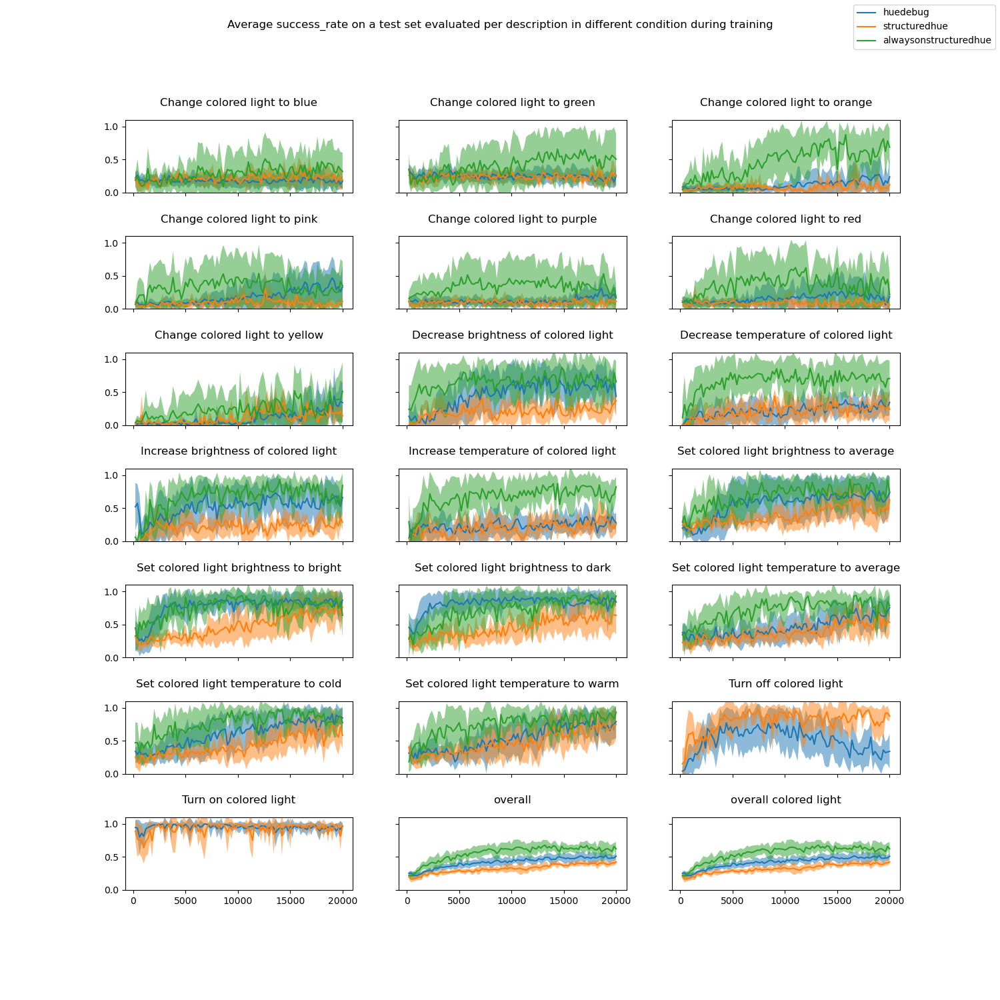

huedebug
structuredhue
alwaysonstructuredhue
************************************ ['huedebug', 'structuredhue', 'alwaysonstructuredhue']


In [57]:
folder = "results/thesis_sim/hue/simulation_hue_"
simulation_names = ["filter", "new_description", "doubleAtt_secondAtt"]
d = [(s, glob.glob(f'{folder}{s}*')) for s in simulation_names]


d = [
    ("huedebug", glob.glob(f'results/simulation_hue_debug_[0-9]*')), 
     ("structuredhue", glob.glob(f'results/simulation_structuredhue_[0-9]*')),
    ("alwaysonstructuredhue", glob.glob(f'results/simulation_alwaysonstructuredhue_[0-9]*'))
]
# s = "simpleAtt"
# d.append((s, glob.glob(f'{folder}{s}_[0-9]')))
# s = 'simulation_no_clipping_up_target_10_no_per'
# f8 = (s, glob.glob(f'results/temp/{s}*'))

# s = 'simulation_no_clipping_up_target_10'
# f9 = (s, glob.glob(f'results/temp/{s}*'))

fig, axes = compare_average_success_rate(*d)

['results/simulation_alwaysonstructuredhue_3',
 'results/simulation_alwaysonstructuredhue_8',
 'results/simulation_alwaysonstructuredhue_6',
 'results/simulation_alwaysonstructuredhue_1',
 'results/simulation_alwaysonstructuredhue_5',
 'results/simulation_alwaysonstructuredhue_4',
 'results/simulation_alwaysonstructuredhue_7',
 'results/simulation_alwaysonstructuredhue_2',
 'results/simulation_alwaysonstructuredhue_0']
['results/simulation_structuredhue_3',
 'results/simulation_structuredhue_6',
 'results/simulation_structuredhue_2',
 'results/simulation_structuredhue_1',
 'results/simulation_structuredhue_7',
 'results/simulation_structuredhue_0',
 'results/simulation_structuredhue_5',
 'results/simulation_structuredhue_8',
 'results/simulation_structuredhue_4']
['results/simulation_huealwayson_3colors_37',
 'results/simulation_huealwayson_3colors_38',
 'results/simulation_huealwayson_3colors_35',
 'results/simulation_huealwayson_3colors_42',
 'results/simulation_huealwayson_3colors_3

<IPython.core.display.Javascript object>


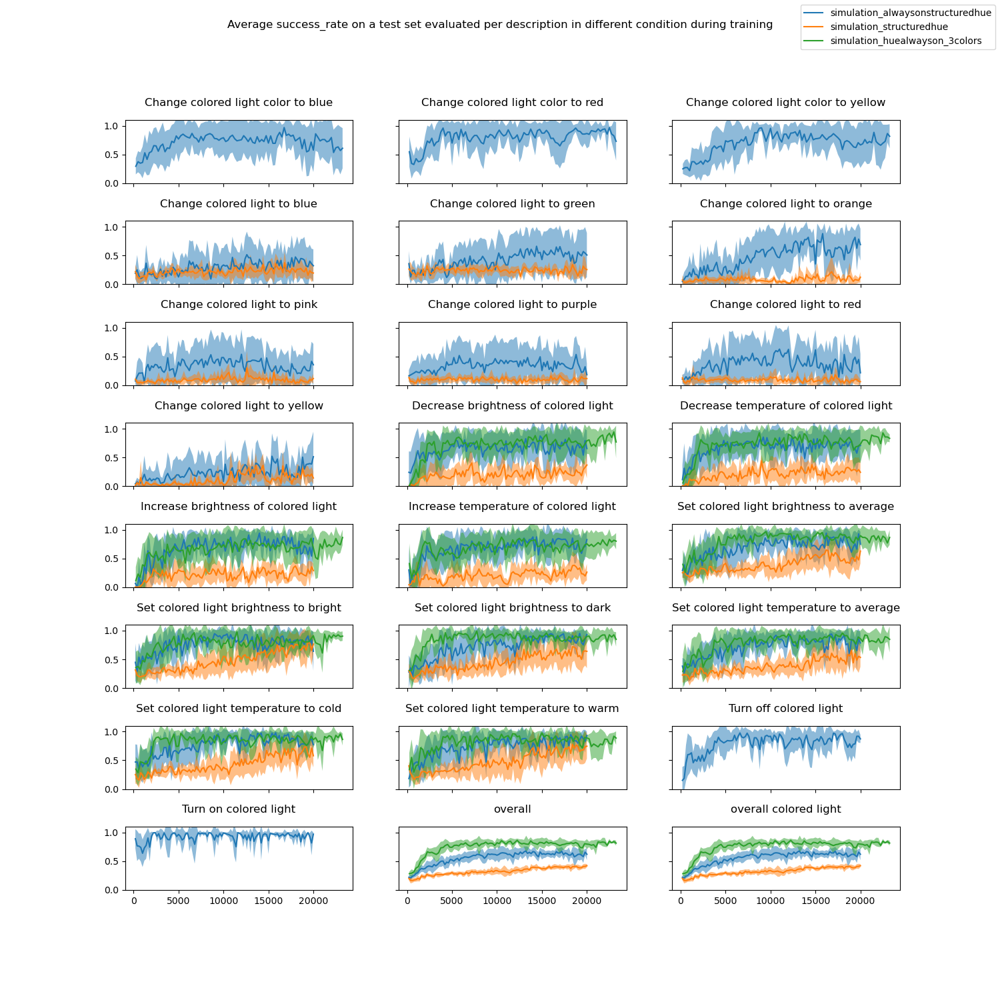

simulation_alwaysonstructuredhue
simulation_structuredhue
simulation_huealwayson_3colors
************************************ ['simulation_alwaysonstructuredhue', 'simulation_structuredhue', 'simulation_huealwayson_3colors']


In [77]:
folder = "results/"
simulation_names = ["simulation_alwaysonstructuredhue", "simulation_structuredhue", "simulation_huealwayson_3colors"]
d = [(s, glob.glob(f'{folder}{s}_[0-9]*')) for s in simulation_names]
# s = "simpleAtt"
# d.append((s, glob.glob(f'{folder}{s}_[0-9]')))
# s = 'simulation_no_clipping_up_target_10_no_per'
# f8 = (s, glob.glob(f'results/temp/{s}*'))

# s = 'simulation_no_clipping_up_target_10'
# f9 = (s, glob.glob(f'results/temp/{s}*'))

fig, axes = compare_average_success_rate(*d)

'results/simulation_bigass_14/test_record.jbl'
done
'results/simulation_bigass_3/test_record.jbl'
done
'results/simulation_bigass_7/test_record.jbl'
done
'results/simulation_bigass_4/test_record.jbl'
done
'results/simulation_bigass_6/test_record.jbl'
done
'results/simulation_bigass_2/test_record.jbl'
done
'results/simulation_bigass_9/test_record.jbl'
done
'results/simulation_bigass_5/test_record.jbl'
done
'results/simulation_bigass_16/test_record.jbl'
done
'results/simulation_bigass_0/test_record.jbl'
done
'results/simulation_bigass_13/test_record.jbl'
done
'results/simulation_bigass_8/test_record.jbl'
done
'results/simulation_bigass_11/test_record.jbl'
done
'results/simulation_bigass_15/test_record.jbl'
done
'results/simulation_bigass_1/test_record.jbl'
done
'results/simulation_bigass_10/test_record.jbl'
done
'results/simulation_bigass_12/test_record.jbl'
done
'results/simulation_bigass_17/test_record.jbl'
done


<IPython.core.display.Javascript object>


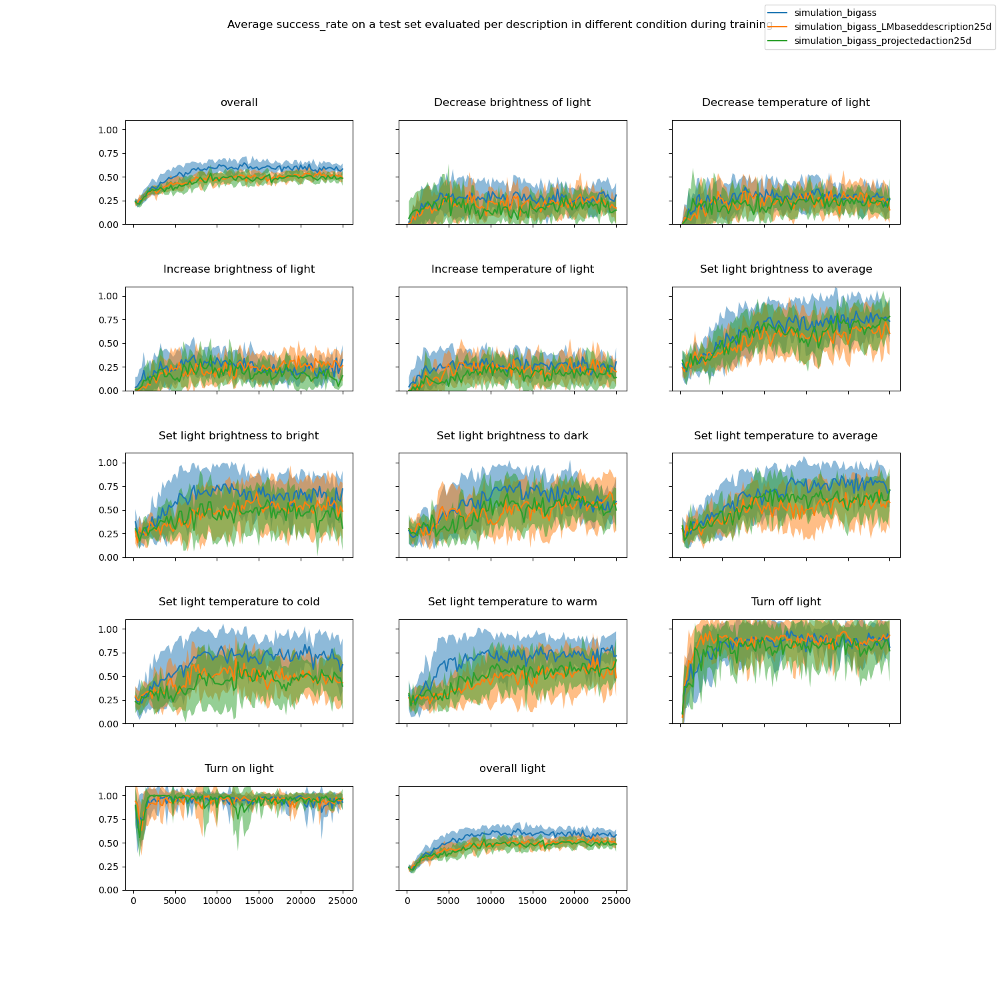

'results/simulation_bigass_LMbaseddescription25d_0/test_record.jbl'
done
'results/simulation_bigass_LMbaseddescription25d_8/test_record.jbl'
done
'results/simulation_bigass_LMbaseddescription25d_5/test_record.jbl'
done
'results/simulation_bigass_LMbaseddescription25d_1/test_record.jbl'
done
'results/simulation_bigass_LMbaseddescription25d_2/test_record.jbl'
done
'results/simulation_bigass_LMbaseddescription25d_3/test_record.jbl'
done
'results/simulation_bigass_LMbaseddescription25d_6/test_record.jbl'
done
'results/simulation_bigass_LMbaseddescription25d_4/test_record.jbl'
done
'results/simulation_bigass_LMbaseddescription25d_7/test_record.jbl'
done
'results/simulation_bigass_projectedaction25d_5/test_record.jbl'
done
'results/simulation_bigass_projectedaction25d_0/test_record.jbl'
done
'results/simulation_bigass_projectedaction25d_3/test_record.jbl'
done
'results/simulation_bigass_projectedaction25d_4/test_record.jbl'
done
'results/simulation_bigass_projectedaction25d_7/test_record.jbl

In [8]:
folder = "results/"
simulation_names = ["simulation_bigass", "simulation_bigass_LMbaseddescription25d", "simulation_bigass_projectedaction25d"]
d = [(s, glob.glob(f'{folder}{s}_[0-9]*')) for s in simulation_names]
# s = "simpleAtt"
# d.append((s, glob.glob(f'{folder}{s}_[0-9]')))
# s = 'simulation_no_clipping_up_target_10_no_per'
# f8 = (s, glob.glob(f'results/temp/{s}*'))

# s = 'simulation_no_clipping_up_target_10'
# f9 = (s, glob.glob(f'results/temp/{s}*'))

fig, axes = compare_average_success_rate(*d)

# Plot averaged simulation

In [47]:
# print(glob.glob(f'results/simulation_*'))
simulation_name = 'AttentionFlatQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/simulation_{simulation_name}*')
print(folders)

['results/simulation_AttentionFlatQnet_5', 'results/simulation_AttentionFlatQnet_9', 'results/simulation_AttentionFlatQnet_2', 'results/simulation_AttentionFlatQnet_10', 'results/simulation_AttentionFlatQnet_11', 'results/simulation_AttentionFlatQnet_4', 'results/simulation_AttentionFlatQnet_1', 'results/simulation_AttentionFlatQnet_8', 'results/simulation_AttentionFlatQnet_3', 'results/simulation_AttentionFlatQnet_6', 'results/simulation_AttentionFlatQnet_7']


In [48]:
flattened_records, reached_counters, target_counters, discovery_records, episodes = load_simulation_list(folders)
reached_averaged = {k: (np.round(np.mean(v)),np.round(np.std(v), 1)) for k,v in reached_counters.items()}
average_discovery = {k: (np.round(np.mean(v)),np.round(np.std(v), 1)) for k,v in discovery_records.items()}
average_flattened = {k: np.mean(v, 0) for k,v in flattened_records.items()}
std_flattened = {k: np.std(v, 0) for k,v in flattened_records.items()}

'results/simulation_AttentionFlatQnet_5/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_9/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_2/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_10/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_11/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_4/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_1/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_8/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_3/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_6/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_7/test_record.jbl'
done


<IPython.core.display.Javascript object>


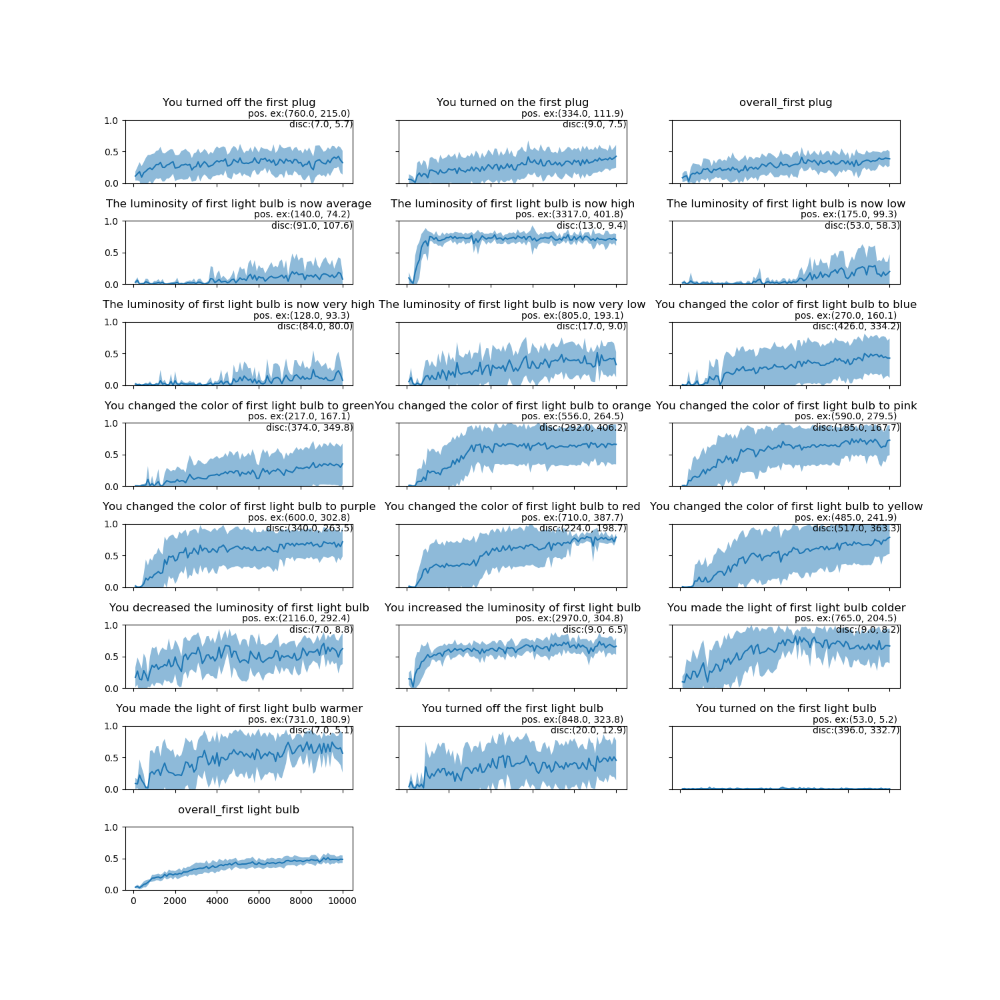

In [49]:
plot_average_success_rates(episodes, average_flattened, reached_averaged, std_record=std_flattened, iter_discovery=average_discovery)

# Thesis

results/2bigass_automatic_thing_selection_v2_explore_300/8 12


<IPython.core.display.Javascript object>


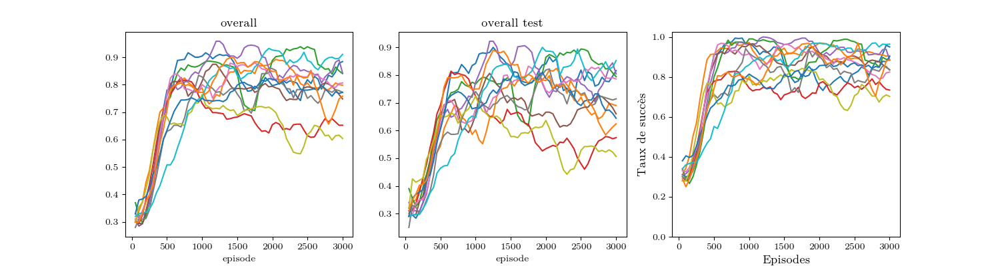

{'overall': <AxesSubplot:>, 'overall test': <AxesSubplot:>, 'overall train': <AxesSubplot:>}
overall
overall test
overall train


In [45]:
simulation_name = '2bigass_automatic_thing_selection_v2_explore_300'
folder = glob.glob(f'results/{simulation_name}/*')
fig, axes = plot_all_sim(folder, keep_fig=['overall', 'overall train', 'overall test'], rolling_window=5)
for ax in axes.values():
    ax.get_legend().remove()
# save_fig(fig, 'bigass_all_sim.pdf')

results/four_simple/8 12
results/three_bigass_v2/2 8
results/living_room_easy_v2/2 4
results/living_room_hard/28 36


<IPython.core.display.Javascript object>


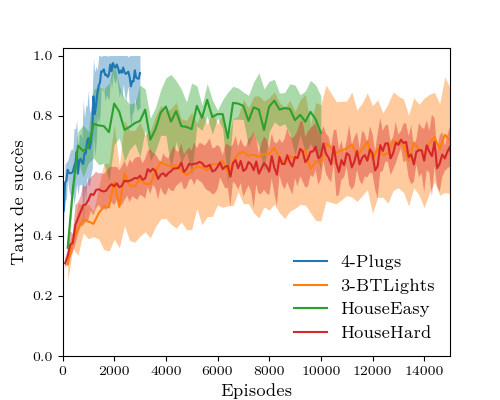

'lmroman7-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


{'overall': <AxesSubplot:>}


In [37]:
simulation_names = ['four_simple', 'three_bigass_v2', 'living_room_easy_v2', 'living_room_hard']
folders = [glob.glob(f'results/{s}/*') for s in simulation_names]
fig, axes = compare_average_success_rate(*zip(simulation_names, folders), keep_fig=['overall'], legend=False, rolling_window=None)
post_process_fig_font(fig=fig, title='', x_label='Episodes', y_label='Taux de succès', 
                      legend=True, legend_names=['4-Plugs', '3-BTLights', 'HouseEasy', 'HouseHard'], xlim=15000)
fig.gca().get_legend().get_frame().set_linewidth(0.0)
save_fig(fig, 'overall_multi_obj.pdf')

results/colored_last/8 10
results/bigass_last/8 10
results/television_last/8 10
results/speaker_last/8 10
results/blinds/2 3


<ipython-input-6-aa99ffafb8df>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nline, ncols, figsize=figsize, sharex=sharex, sharey=sharey)


<IPython.core.display.Javascript object>


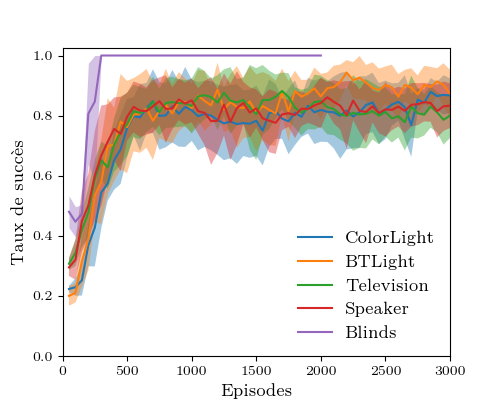

{'overall': <AxesSubplot:>}


'lmroman7-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


In [35]:
simulation_names = ['colored_last', 'bigass_last', 'television_last', 'speaker_last', 'blinds']
folders = [glob.glob(f'results/{s}/*') for s in simulation_names]
fig, axes = compare_average_success_rate(*zip(simulation_names, folders), keep_fig=['overall'], legend=False, rolling_window=None)
post_process_fig_font(fig=fig, title='', x_label='Episodes', y_label='Taux de succès', 
                      legend=True, legend_names=['ColorLight', 'BTLight', 'Television', 'Speaker', 'Blinds'],
                     xlim=3000)
fig.gca().get_legend().get_frame().set_linewidth(0.0)
save_fig(fig, 'single_obj_sim.pdf')

results/living_room_easy_v2/2 4


<IPython.core.display.Javascript object>


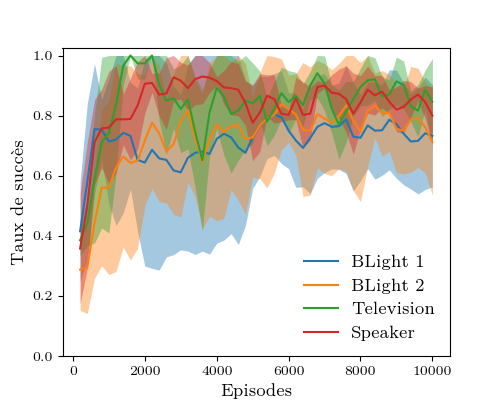

'lmroman7-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


In [121]:
simulation_name = 'living_room_easy_v2' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/{simulation_name}/*')
fig, axes = plot_on_one_fig(folders, names=['overall lamp', 'overall light',  'overall television', 'overall speaker'], 
                use_error=False, rolling_window=2, legend_names=['BLight 1', 'BLight 2', 'Television', 'Speaker'])
axes.get_legend().get_frame().set_linewidth(0.0)
save_fig(fig, 'livingroom_easy.pdf')

results/four_simple/8 12


<IPython.core.display.Javascript object>


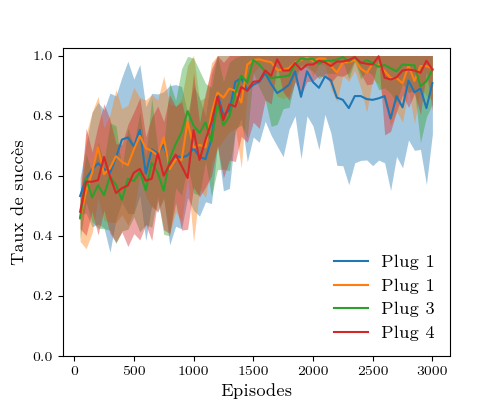

'lmroman7-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


In [130]:
simulation_name = 'four_simple' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/{simulation_name}/*')
fig, axes = plot_on_one_fig(folders, names=['overall light', 'overall bulb',  'overall heater', 'overall lamp'], 
                use_error=False, rolling_window=None, legend_names=['Plug 1', 'Plug 1', 'Plug 3', 'Plug 4'])
axes.legend(fontsize=12, loc='lower right')
axes.get_legend().get_frame().set_linewidth(0.0)
save_fig(fig, 'four_simple.pdf')

results/twobigass/23 9


<IPython.core.display.Javascript object>


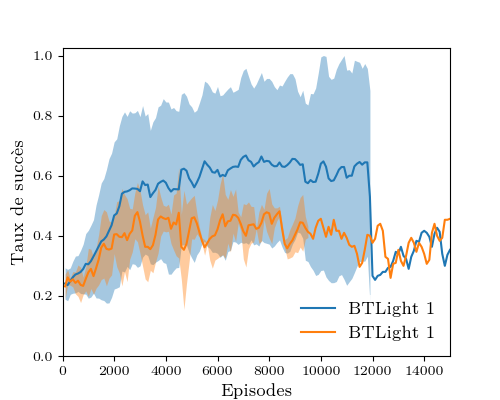

In [142]:
simulation_name = 'twobigass' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/{simulation_name}/*')
fig, axes = plot_on_one_fig(folders, names=['overall light', 'overall bulb'], 
                use_error=False, rolling_window=None, xlim=15000, legend_names=['BTLight 1', 'BTLight 1', 'BTLight 3'])
# handles, labels = axes.get_legend_handles_labels()

axes.legend(fontsize=12, loc='lower right')
axes.get_legend().get_frame().set_linewidth(0.0)
# save_fig(fig, 'two_bigass.pdf')

results/three_bigass_v2/2 8


<IPython.core.display.Javascript object>


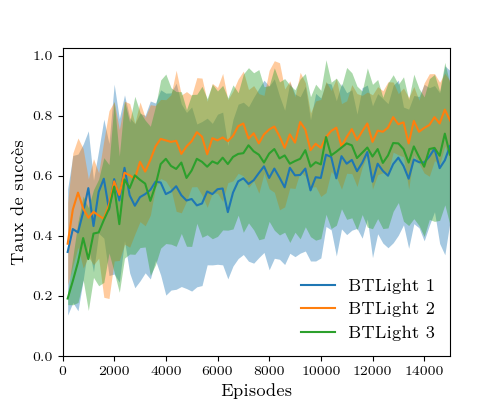

'lmroman7-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


In [143]:
simulation_name = 'three_bigass_v2' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/{simulation_name}/*')
fig, axes = plot_on_one_fig(folders, names=['overall light', 'overall bulb',  'overall lamp'], 
                use_error=False, rolling_window=None, xlim=15000, legend_names=['BTLight 1', 'BTLight 2', 'BTLight 3'])
# handles, labels = axes.get_legend_handles_labels()

axes.legend(fontsize=12, loc='lower right')
axes.get_legend().get_frame().set_linewidth(0.0)
save_fig(fig, 'three_bigass_v2.pdf')

results/living_room_hard/28 36


<IPython.core.display.Javascript object>


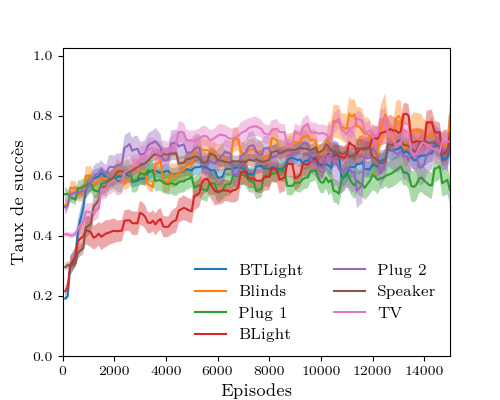

'lmroman7-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


In [128]:
simulation_name = 'living_room_hard' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/{simulation_name}/*')
fig, axes = plot_on_one_fig(folders, names=['overall bulb', 'overall blinds', 'overall heater', 'overall lamp', 'overall light', 'overall speaker', 'overall television'], 
                legend_names=['BTLight', 'Blinds', 'Plug 1', 'BLight','Plug 2','Speaker','TV'], use_error=True, xlim=15000, rolling_window=3)
lines, labels = axes.get_legend_handles_labels()
# lines.insert(0, plt.Line2D([0],[0], linestyle=None, marker=None, color='white'))
# labels.insert(0,'')
plt.legend(lines,labels,numpoints=1,ncol=2, fontsize=11, frameon=True)
axes.get_legend().get_frame().set_linewidth(0.0)
save_fig(fig, 'livingroom_hard.pdf')

results/2bigass_automatic_thing_selection_v2_explore_300/8 12


<IPython.core.display.Javascript object>


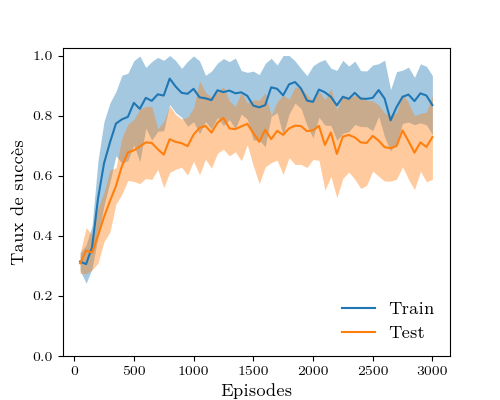

'lmroman7-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


In [21]:
simulation_name = '2bigass_automatic_thing_selection_v2_explore_300' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/{simulation_name}/*')
fig, axes = plot_on_one_fig(folders, names=['overall train', 'overall test'], legend_names=['Train', 'Test'])
axes.legend(fontsize=12, loc='lower right')
fig.gca().get_legend().get_frame().set_linewidth(0.0)
save_fig(fig, 'two_bigass_transfer_learning_with_thing_selection.pdf')

results/three_bigass_transfer_learning/8 10


<IPython.core.display.Javascript object>


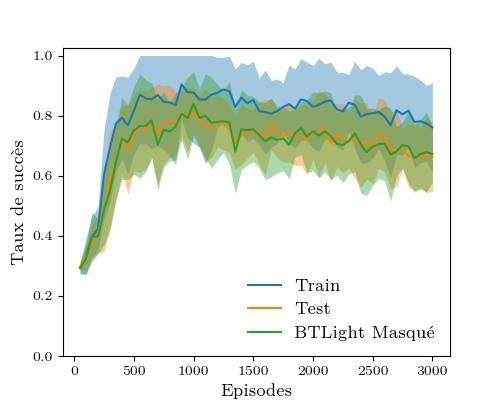

'lmroman7-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


In [44]:
simulation_name = 'three_bigass_transfer_learning' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/{simulation_name}/*')
fig, axes = plot_on_one_fig(folders, names=['overall train', 'overall test', 'overall bulb'], legend_names=['Train', 'Test', 'BTLight Masqué'])
axes.legend(fontsize=12, loc='lower right')
fig.gca().get_legend().get_frame().set_linewidth(0.0)
save_fig(fig, 'three_bigass_transfer_learning.pdf')

results/1_to_5_simple/8 10


<IPython.core.display.Javascript object>


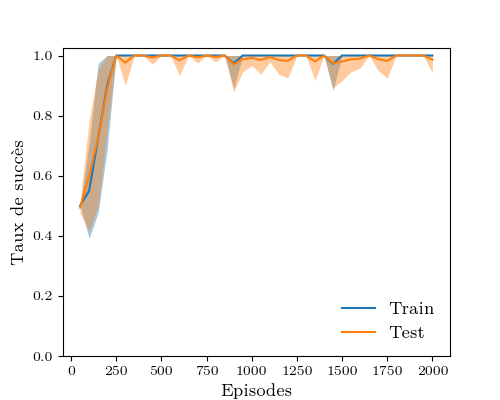

'lmroman7-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


In [18]:
# simulation_name = '1_to_5_simple' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/{simulation_name}/*')
fig, axes = plot_on_one_fig(folders, names=['overall train', 'overall test'], legend_names=['Train', 'Test'])
axes.legend(fontsize=12, loc='lower right')
fig.gca().get_legend().get_frame().set_linewidth(0.0)
save_fig(fig, '1_to_5_simple.pdf')

results/1_to_3_bigass_v2/8 10


<IPython.core.display.Javascript object>


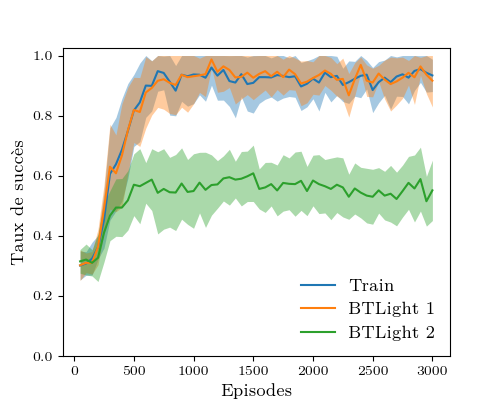

'lmroman7-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


In [51]:
simulation_name = '1_to_3_bigass_v2' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/{simulation_name}/*')
fig, axes = plot_on_one_fig(folders, names=['overall train', 'overall bulb', 'overall lamp'], legend_names=['Train', 'BTLight 1', 'BTLight 2'])
axes.legend(fontsize=12, loc='lower right')
fig.gca().get_legend().get_frame().set_linewidth(0.0)
save_fig(fig, '1_to_3_bigass_v2.pdf')

results/speaker_simplttv_to_2volumetv/2 8


<IPython.core.display.Javascript object>


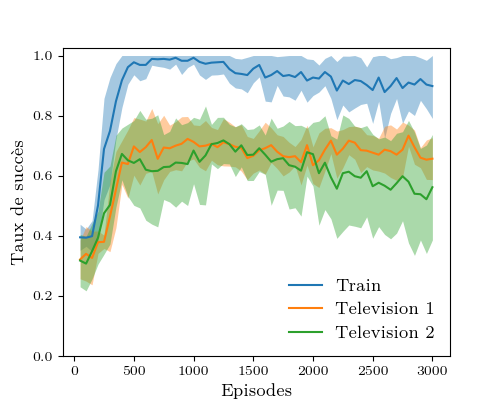

'lmroman7-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


In [33]:
simulation_name = 'speaker_simplttv_to_2volumetv' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/{simulation_name}/*')
fig, axes = plot_on_one_fig(folders, names=['overall train', 'overall television', 'overall device'], legend_names=['Train' ,'Television 1' ,'Television 2'])
axes.legend(fontsize=12, loc='lower right')
fig.gca().get_legend().get_frame().set_linewidth(0.0)
save_fig(fig, 'speaker_simplttv_to_2volumetv.pdf')

# Usage

['results/three_bigass/2',
 'results/three_bigass/3',
 'results/three_bigass/5',
 'results/three_bigass/4',
 'results/three_bigass/1',
 'results/three_bigass/6']
no rolling mean for results/three_bigass/2
no rolling mean for results/three_bigass/3
no rolling mean for results/three_bigass/5
no rolling mean for results/three_bigass/4
no rolling mean for results/three_bigass/1
no rolling mean for results/three_bigass/6


<IPython.core.display.Javascript object>


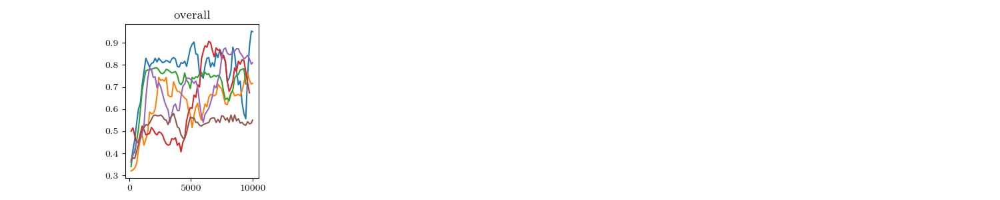

overall


In [21]:
simulation_name = 'three_bigass' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/{simulation_name}/*')
# df_mean, df_std, reached_counters, target_counters, discovery_records  = load_simulation_list(folders, agg=False)
plot_all_sim(folders, keep_fig=['overall'])

results/2_to_4_simple_automatic_thing_selection/2 5


<IPython.core.display.Javascript object>


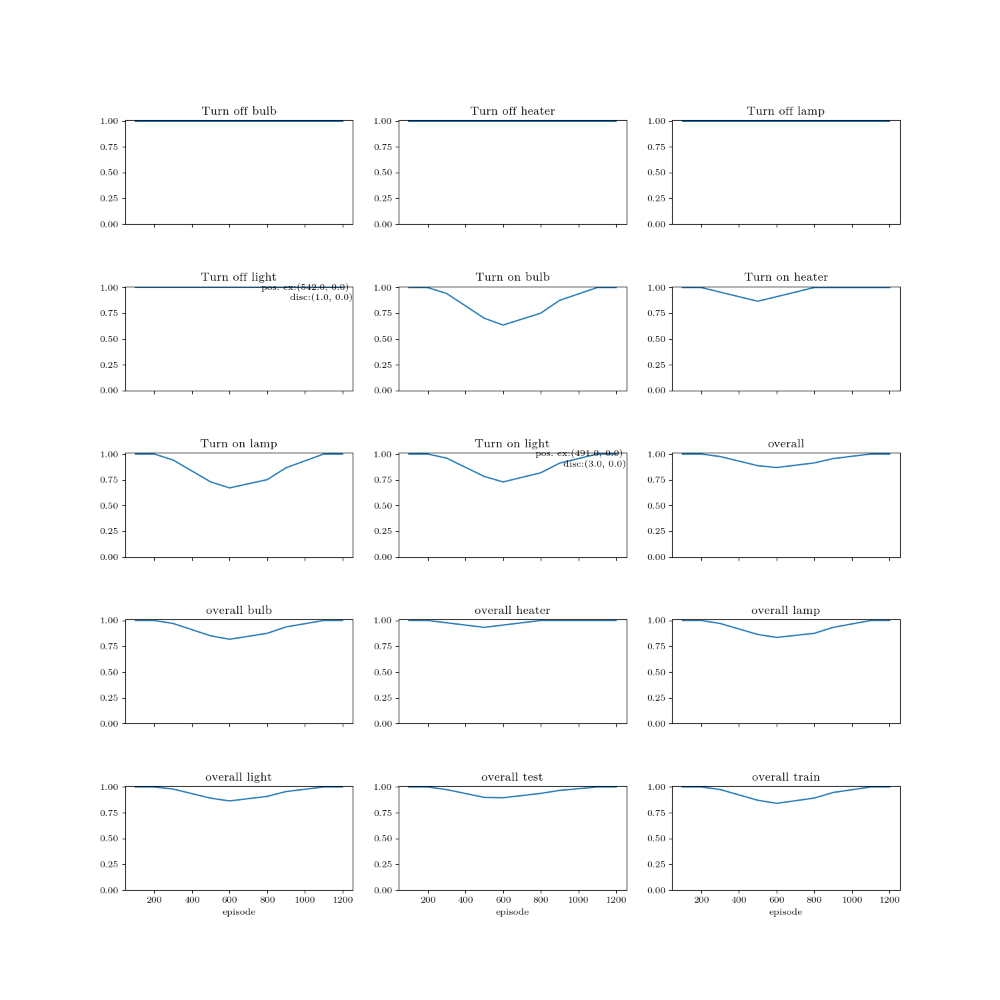

In [97]:
simulation_name = '2_to_4_simple_automatic_thing_selection' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/{simulation_name}/*')
load_and_plot(folders)

['results/living_room_hard/28',
 'results/living_room_hard/8',
 'results/living_room_hard/23',
 'results/living_room_hard/35',
 'results/living_room_hard/20',
 'results/living_room_hard/19',
 'results/living_room_hard/33',
 'results/living_room_hard/2',
 'results/living_room_hard/21',
 'results/living_room_hard/16',
 'results/living_room_hard/3',
 'results/living_room_hard/7',
 'results/living_room_hard/29',
 'results/living_room_hard/24',
 'results/living_room_hard/5',
 'results/living_room_hard/31',
 'results/living_room_hard/15',
 'results/living_room_hard/4',
 'results/living_room_hard/1',
 'results/living_room_hard/18',
 'results/living_room_hard/26',
 'results/living_room_hard/27',
 'results/living_room_hard/6',
 'results/living_room_hard/9',
 'results/living_room_hard/25',
 'results/living_room_hard/0',
 'results/living_room_hard/34',
 'results/living_room_hard/10',
 'results/living_room_hard/36',
 'results/living_room_hard/32',
 'results/living_room_hard/37',
 'results/living_r

<IPython.core.display.Javascript object>


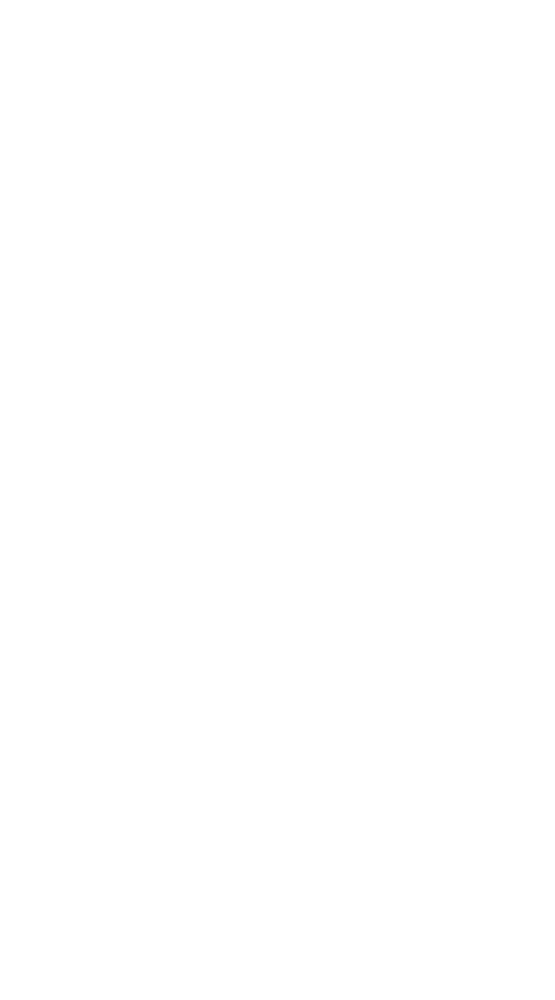

In [175]:
simulation_name = 'living_room_hard' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/{simulation_name}/*')
load_and_plot(folders)

['results/three_bigass_notalwayson/2',
 'results/three_bigass_notalwayson/3',
 'results/three_bigass_notalwayson/5',
 'results/three_bigass_notalwayson/4',
 'results/three_bigass_notalwayson/1',
 'results/three_bigass_notalwayson/0']
no rolling mean for results/three_bigass_notalwayson/2
no rolling mean for results/three_bigass_notalwayson/3
no rolling mean for results/three_bigass_notalwayson/5
no rolling mean for results/three_bigass_notalwayson/4
no rolling mean for results/three_bigass_notalwayson/1
no rolling mean for results/three_bigass_notalwayson/0


<IPython.core.display.Javascript object>


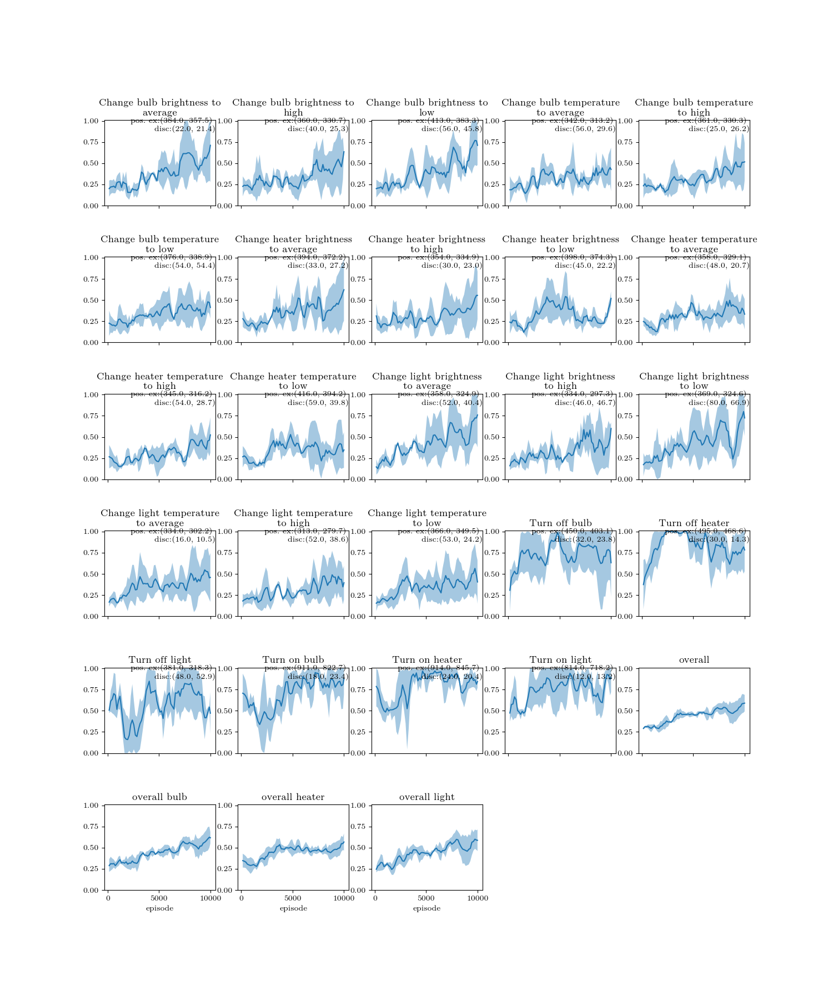

In [23]:
simulation_name = 'three_bigass_notalwayson' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/{simulation_name}/*')
load_and_plot(folders)

'results/second_round/simulation_NoAttentionFlatQnet_0/test_record.jbl'
done
'results/second_round/simulation_NoAttentionFlatQnet_3/test_record.jbl'
done
'results/second_round/simulation_NoAttentionFlatQnet_4/test_record.jbl'
done
'results/second_round/simulation_NoAttentionFlatQnet_2/test_record.jbl'
done
'results/second_round/simulation_NoAttentionFlatQnet_1/test_record.jbl'
done


<IPython.core.display.Javascript object>


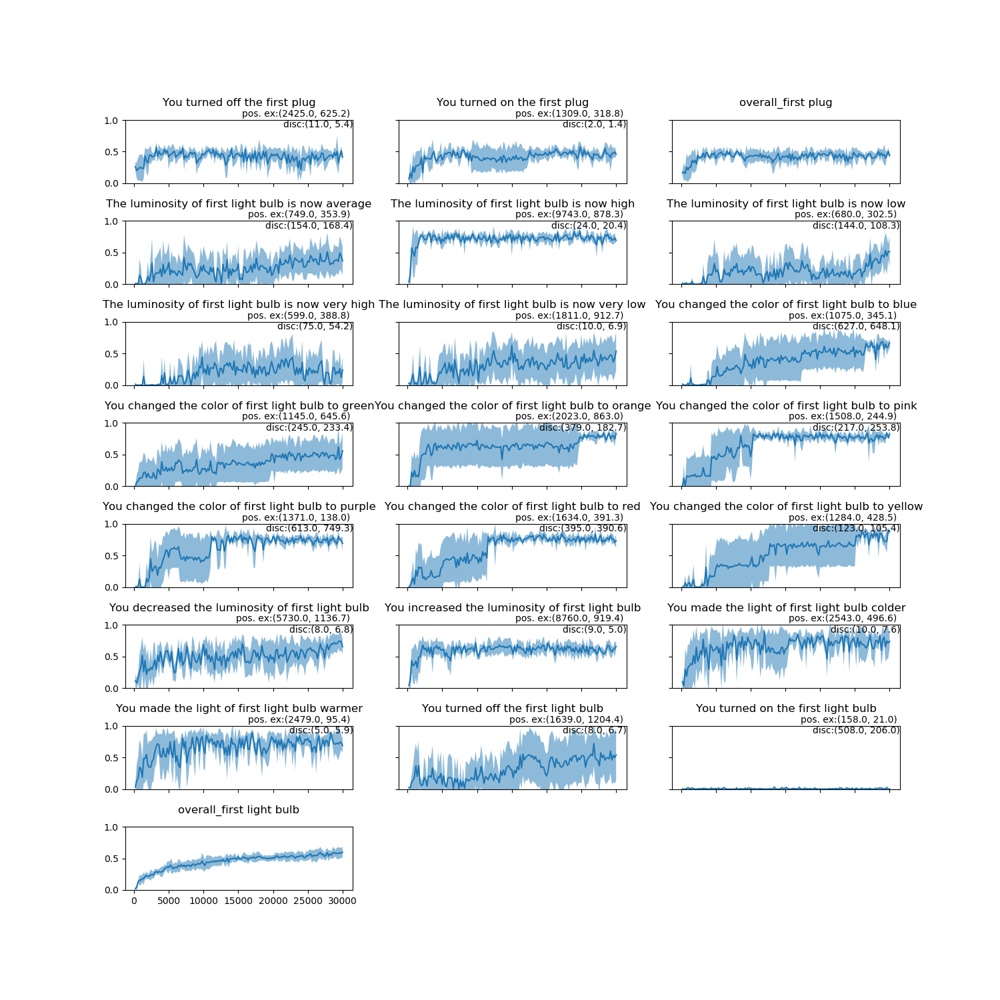

In [21]:
simulation_name = 'NoAttentionFlatQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/second_round/simulation_{simulation_name}*')
load_and_plot(folders)

'results/second_round/simulation_AttentionFlatQnet_2/test_record.jbl'
done
'results/second_round/simulation_AttentionFlatQnet_4/test_record.jbl'
done
'results/second_round/simulation_AttentionFlatQnet_1/test_record.jbl'
done
'results/second_round/simulation_AttentionFlatQnet_3/test_record.jbl'
done
'results/second_round/simulation_AttentionFlatQnet_0/test_record.jbl'
done


<IPython.core.display.Javascript object>


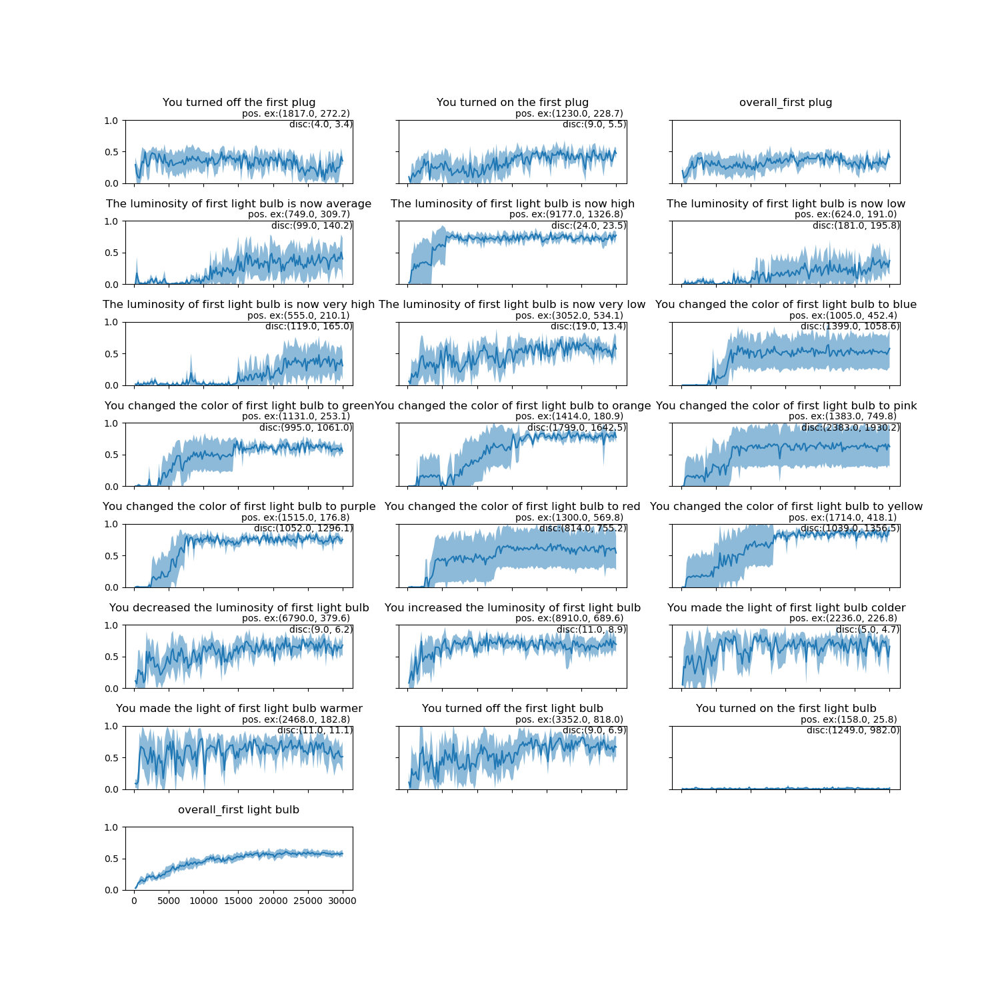

In [22]:
simulation_name = 'AttentionFlatQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/second_round/simulation_{simulation_name}*')
load_and_plot(folders)

'results/second_round/simulation_DeepSetQnet_3/test_record.jbl'
done
'results/second_round/simulation_DeepSetQnet_1/test_record.jbl'
done
'results/second_round/simulation_DeepSetQnet_0/test_record.jbl'
done
'results/second_round/simulation_DeepSetQnet_2/test_record.jbl'
done
'results/second_round/simulation_DeepSetQnet_4/test_record.jbl'
done


<IPython.core.display.Javascript object>


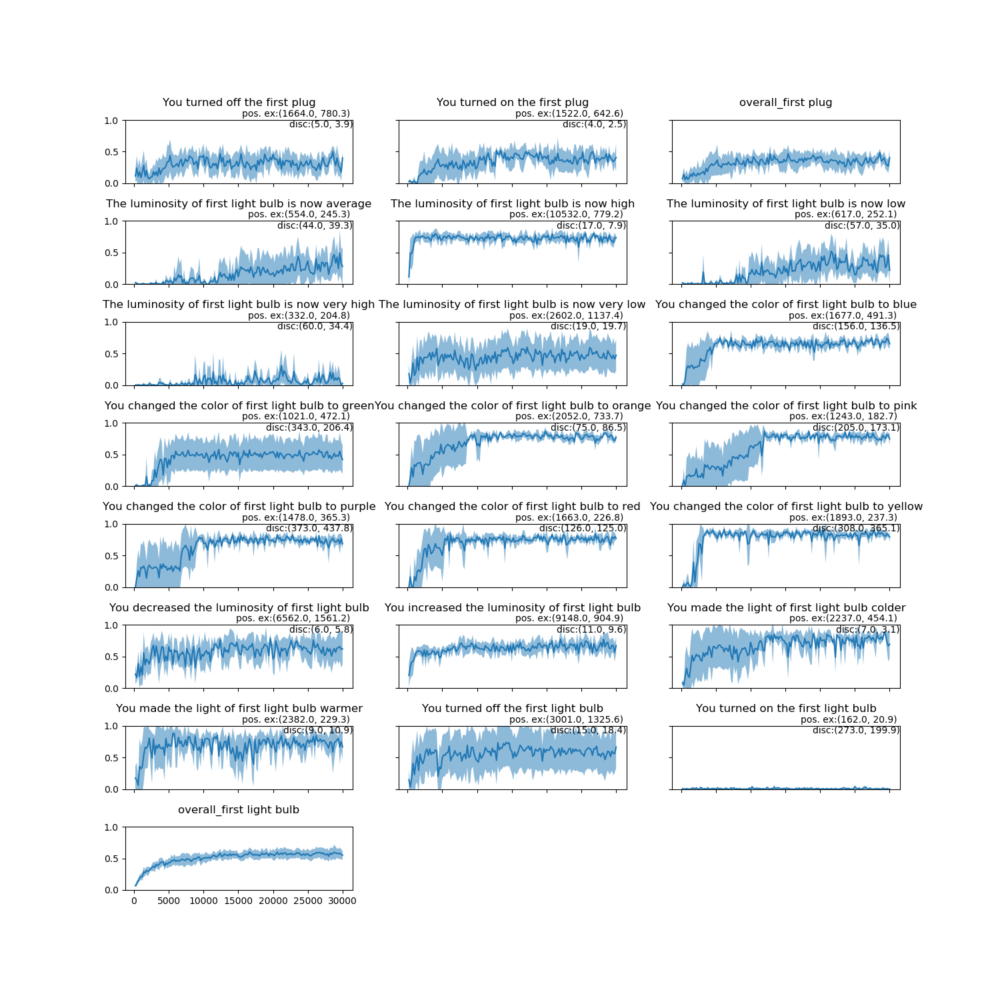

In [23]:
simulation_name = 'DeepSetQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/second_round/simulation_{simulation_name}*')
load_and_plot(folders)

'results/Simulation pretrained LM/simulation_pretrained_lm_5/test_record.jbl'
done
'results/Simulation pretrained LM/simulation_pretrained_lm_0/test_record.jbl'
done
'results/Simulation pretrained LM/simulation_pretrained_lm_1/test_record.jbl'
done
'results/Simulation pretrained LM/simulation_pretrained_lm_2/test_record.jbl'
done


<IPython.core.display.Javascript object>


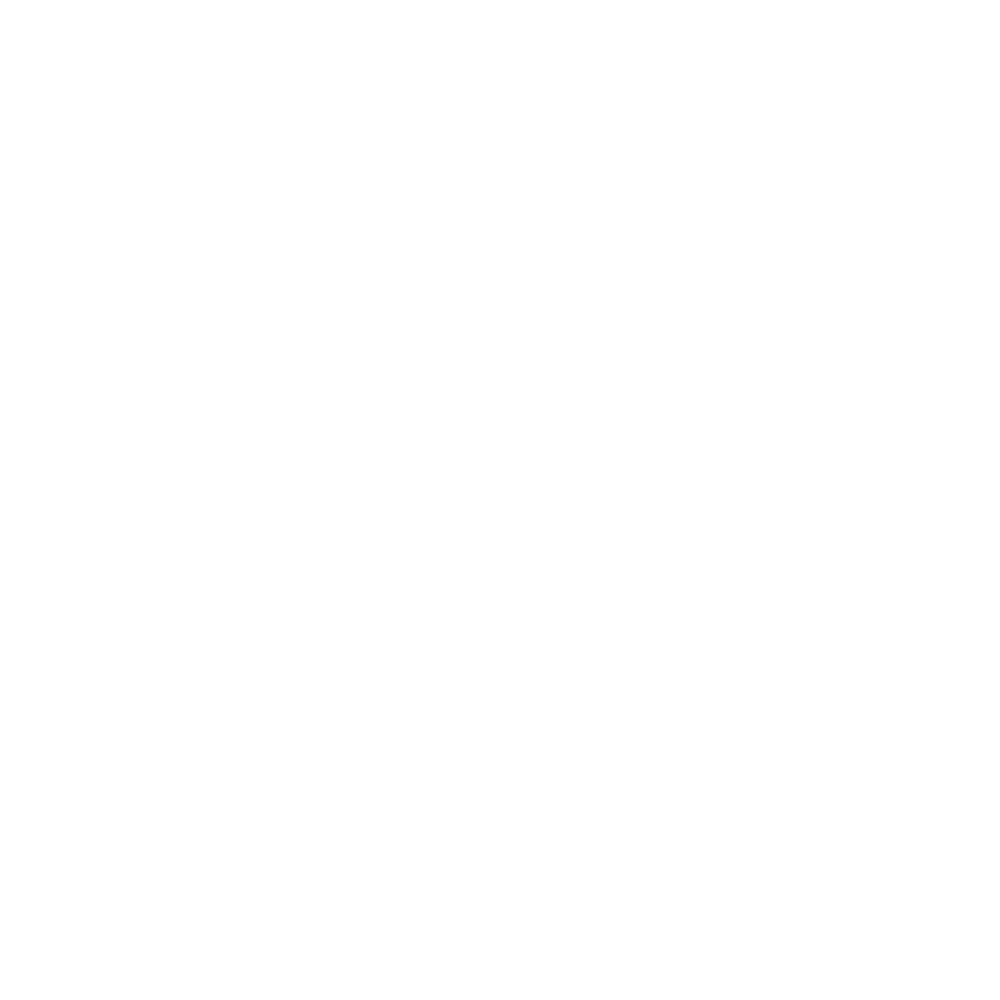

In [10]:
simulation_name = 'pretrained_lm' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/Simulation pretrained LM/simulation_{simulation_name}*')
load_and_plot(folders)

# Comparision

['results/three_bigass_noton/8',
 'results/three_bigass_noton/2',
 'results/three_bigass_noton/3',
 'results/three_bigass_noton/7',
 'results/three_bigass_noton/5',
 'results/three_bigass_noton/4',
 'results/three_bigass_noton/1',
 'results/three_bigass_noton/6',
 'results/three_bigass_noton/9',
 'results/three_bigass_noton/0',
 'results/three_bigass_noton/10',
 'results/three_bigass_noton/11']
no rolling mean for results/three_bigass_noton/8
no rolling mean for results/three_bigass_noton/2
no rolling mean for results/three_bigass_noton/3
no rolling mean for results/three_bigass_noton/7
no rolling mean for results/three_bigass_noton/5
no rolling mean for results/three_bigass_noton/4
no rolling mean for results/three_bigass_noton/1
no rolling mean for results/three_bigass_noton/6
no rolling mean for results/three_bigass_noton/9
no rolling mean for results/three_bigass_noton/0
no rolling mean for results/three_bigass_noton/10
no rolling mean for results/three_bigass_noton/11
['results/th

<IPython.core.display.Javascript object>


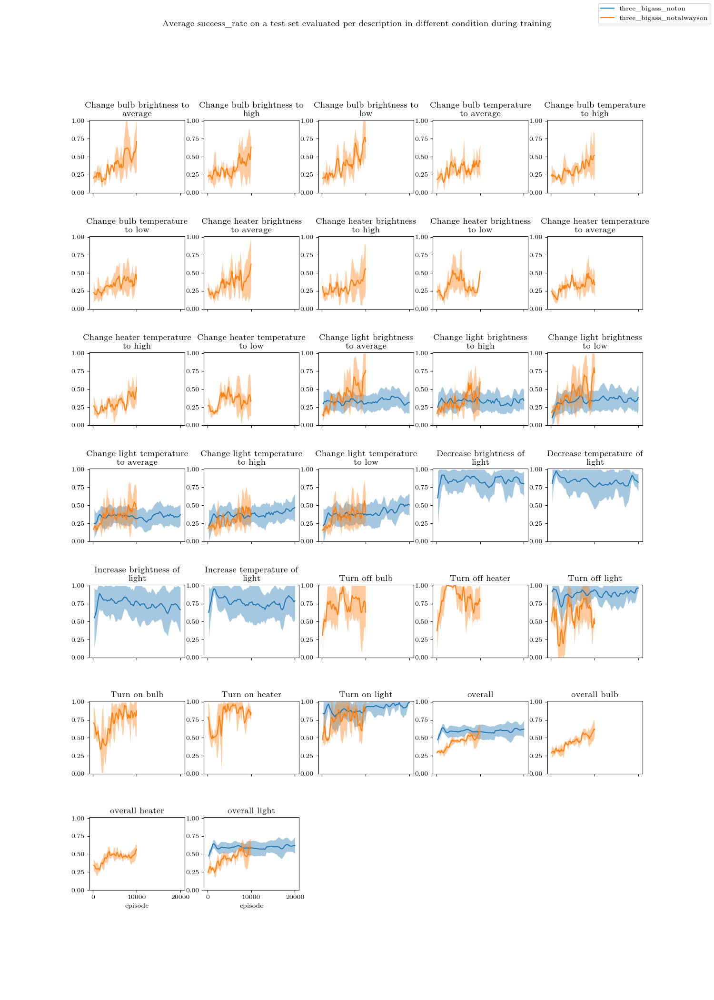

(<Figure size 1500x2100 with 35 Axes>,
 {'Change bulb brightness to average': <AxesSubplot:title={'center':'Change bulb brightness to\naverage'}, xlabel='episode'>,
  'Change bulb brightness to high': <AxesSubplot:title={'center':'Change bulb brightness to\nhigh'}, xlabel='episode'>,
  'Change bulb brightness to low': <AxesSubplot:title={'center':'Change bulb brightness to\nlow'}, xlabel='episode'>,
  'Change bulb temperature to average': <AxesSubplot:title={'center':'Change bulb temperature\nto average'}, xlabel='episode'>,
  'Change bulb temperature to high': <AxesSubplot:title={'center':'Change bulb temperature\nto high'}, xlabel='episode'>,
  'Change bulb temperature to low': <AxesSubplot:title={'center':'Change bulb temperature\nto low'}, xlabel='episode'>,
  'Change heater brightness to average': <AxesSubplot:title={'center':'Change heater brightness\nto average'}, xlabel='episode'>,
  'Change heater brightness to high': <AxesSubplot:title={'center':'Change heater brightness\nto 

In [188]:
simulation_names = ['three_bigass_noton', 'three_bigass_notalwayson']
folders = [glob.glob(f'results/{s}/*') for s in simulation_names]
compare_average_success_rate(*zip(simulation_names, folders))
# a,b = zip(simulation_names, folders)
# print(a,b)

['results/simple_withwarmstart/3',
 'results/simple_withwarmstart/5',
 'results/simple_withwarmstart/4']
['results/simple_nowarmstart/2',
 'results/simple_nowarmstart/1',
 'results/simple_nowarmstart/0']


<IPython.core.display.Javascript object>


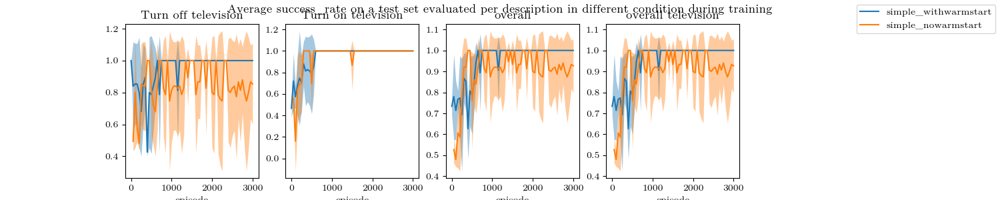

(<Figure size 1500x300 with 5 Axes>,
 {'Turn off television': <AxesSubplot:title={'center':'Turn off television'}, xlabel='episode'>,
  'Turn on television': <AxesSubplot:title={'center':'Turn on television'}, xlabel='episode'>,
  'overall': <AxesSubplot:title={'center':'overall'}, xlabel='episode'>,
  'overall television': <AxesSubplot:title={'center':'overall television'}, xlabel='episode'>})

In [24]:
simulation_names = ['simple_withwarmstart', 'simple_nowarmstart']
folders = [glob.glob(f'results/{s}/*') for s in simulation_names]
compare_average_success_rate(*zip(simulation_names, folders))
# a,b = zip(simulation_names, folders)
# print(a,b)

'results/mse_pretrained_lm/simulation_mse_pretrained_lm_2/test_record.jbl'
done
'results/mse_pretrained_lm/simulation_mse_pretrained_lm_4/test_record.jbl'
done
'results/mse_pretrained_lm/simulation_mse_pretrained_lm_5/test_record.jbl'
done
'results/mse_pretrained_lm/simulation_mse_pretrained_lm_6/test_record.jbl'
done


<IPython.core.display.Javascript object>


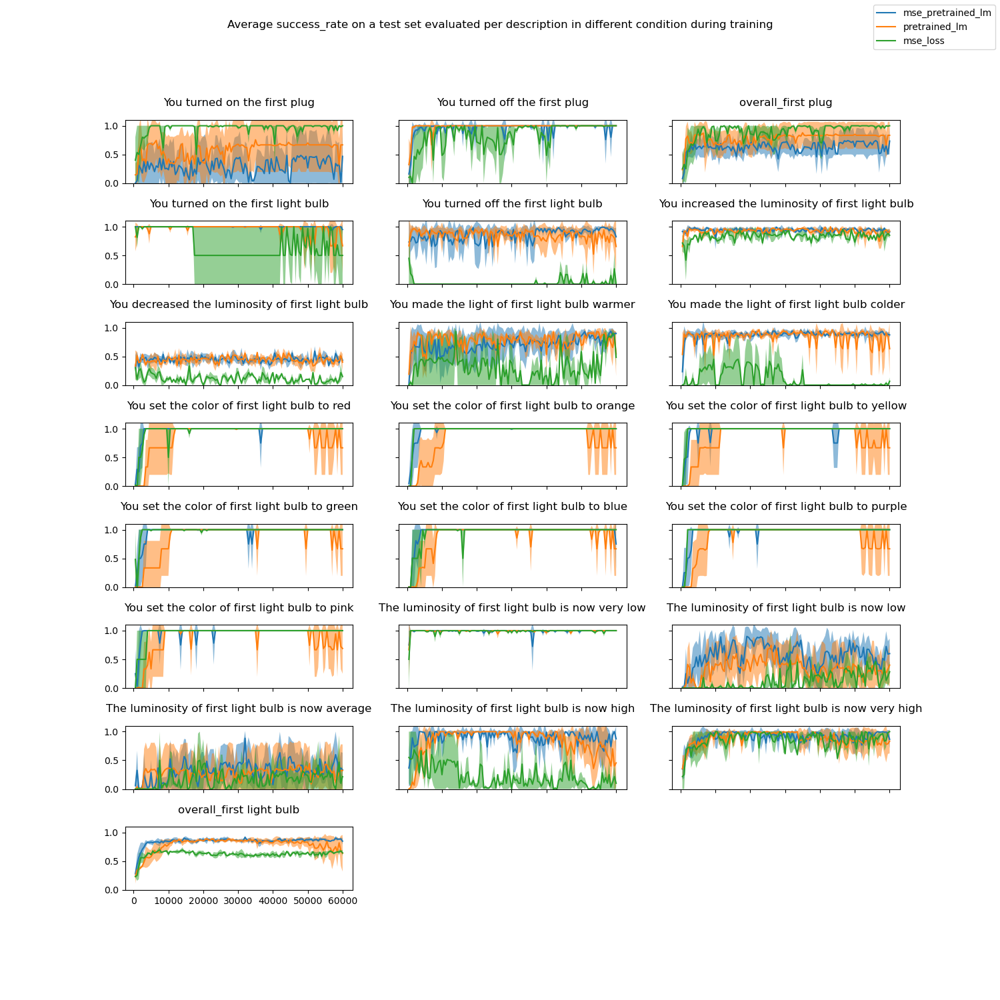

'results/pretrained_lm/simulation_pretrained_lm_5/test_record.jbl'
done
'results/pretrained_lm/simulation_pretrained_lm_0/test_record.jbl'
done
'results/pretrained_lm/simulation_pretrained_lm_3/test_record.jbl'
done
'results/mse_loss/simulation_mse_loss_5/test_record.jbl'
done
'results/mse_loss/simulation_mse_loss_2/test_record.jbl'
done
************************************ ['mse_pretrained_lm', 'pretrained_lm', 'mse_loss']


In [11]:
# simulation_name = 'NoAttentionFlatQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
# folders = glob.glob(f'results/third_round/simulation_{simulation_name}*')
# load_and_plot(folders)

# s1 = 'NoAttentionFlatQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
# f1 = glob.glob(f'results/second_round/simulation_{s1}*')

# s2 = 'AttentionFlatQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
# f2 = glob.glob(f'results/second_round/simulation_{s2}*')

# s3 = 'DeepSetQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
# f3 = glob.glob(f'results/second_round/simulation_{s3}*')

# s4 = 'without_do_nothing' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
# f4 = glob.glob(f'results/without_do_nothing/simulation_pretrained_lm*')

# s5 = 'with_do_nothing' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
# f5 = glob.glob(f'results/with_do_nothing/simulation_pretrained_lm*')

s6 = 'mse_pretrained_lm' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
f6 = glob.glob(f'results/mse_pretrained_lm/*')


s7 = 'pretrained_lm' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
f7 = glob.glob(f'results/pretrained_lm/*')


s8 = 'mse_loss' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
f8 = glob.glob(f'results/mse_loss/*')


# fig, axes = compare_average_success_rate((s1, f1), (s2, f2), (s3, f3), (s4, f4))
fig, axes = compare_average_success_rate((s6, f6), (s7, f7), (s8, f8))

'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_0/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_8/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_24/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_20/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_25/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_2/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_13/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_7/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_12/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_6/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_4/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_n

<IPython.core.display.Javascript object>


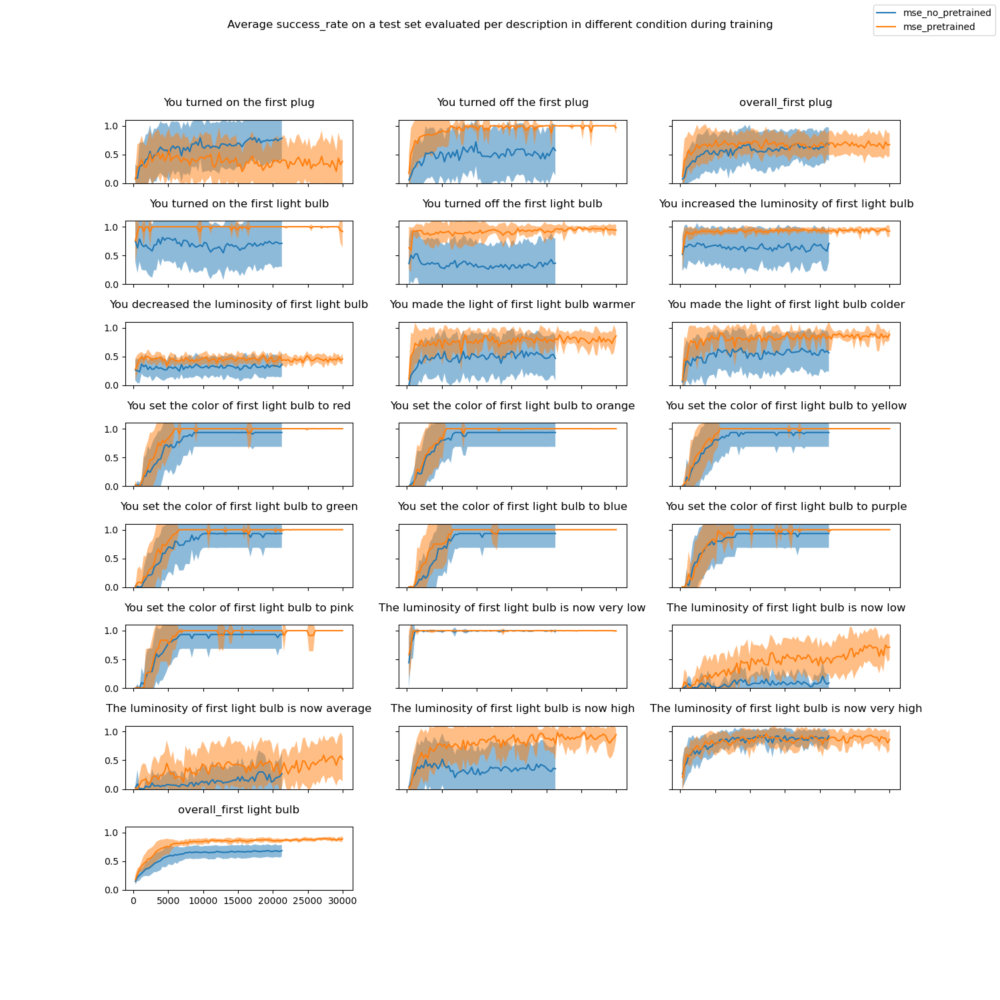

'results/batch_mse_pretrained/simulation_mse_pretrained_35/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_14/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_10/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_22/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_15/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_7/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_20/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_27/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_16/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_9/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_6/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_17/test_record.jbl'
done
*******************************

In [9]:
s = 'mse_no_pretrained'
f6 = (s,glob.glob(f'results/batch_{s}/*'))

s = 'mse_pretrained'
f7 = (s,glob.glob(f'results/batch_{s}/*'))

# s = 'smooth_no_pretrained'
# f8 = (s,glob.glob(f'results/batch_{s}/*'))

# s = 'smooth_pretrained'
# f9 = (s,glob.glob(f'results/batch_{s}/*'))


# fig, axes = compare_average_success_rate((s1, f1), (s2, f2), (s3, f3), (s4, f4))
fig, axes = compare_average_success_rate(f6,f7)

'results/simulation_new_pre_1/test_record.jbl'
done
'results/simulation_new_pre_2/test_record.jbl'
done
'results/simulation_new_pre_0/test_record.jbl'
done


<IPython.core.display.Javascript object>


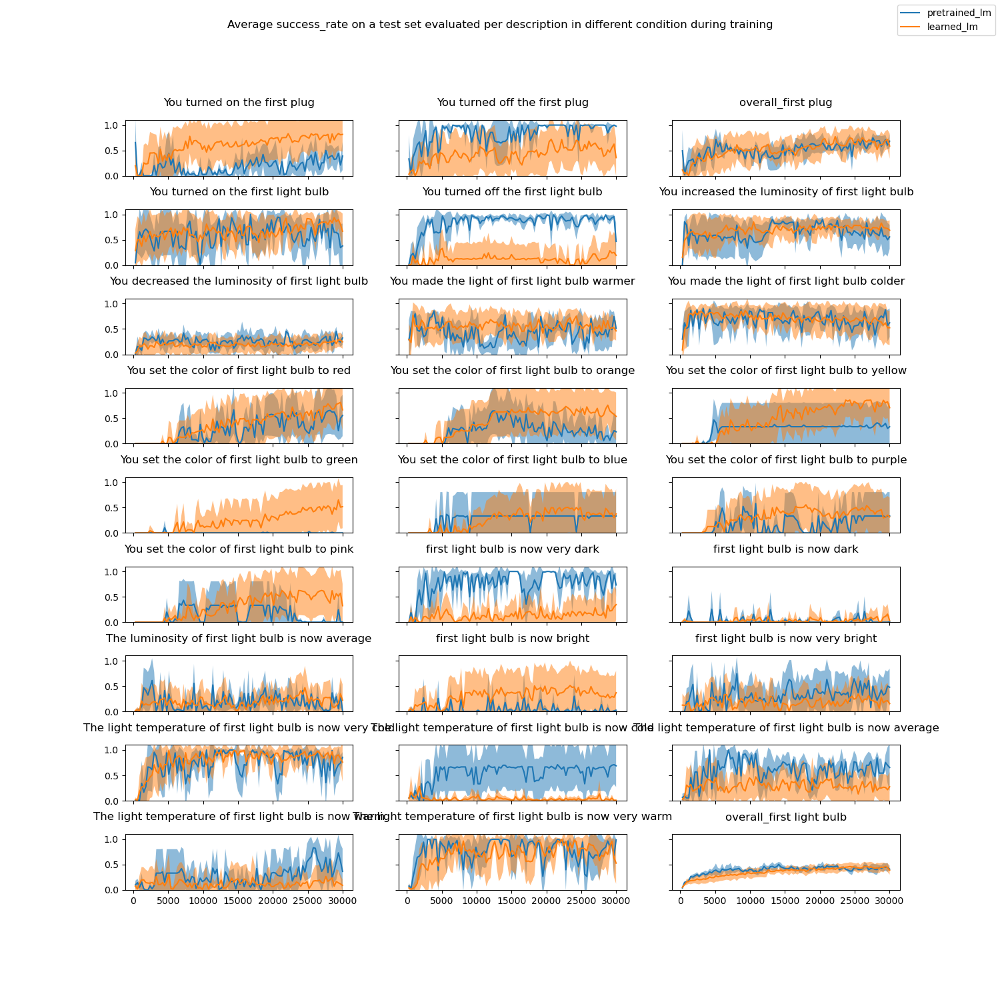

'results/simulation_tv_57/test_record.jbl'
done
'results/simulation_tv_62/test_record.jbl'
done
'results/simulation_tv_59/test_record.jbl'
done
'results/simulation_tv_60/test_record.jbl'
done
'results/simulation_tv_56/test_record.jbl'
done
'results/simulation_tv_63/test_record.jbl'
done
'results/simulation_tv_54/test_record.jbl'
done
'results/simulation_tv_58/test_record.jbl'
done
************************************ ['pretrained_lm', 'learned_lm']


In [27]:
s = 'pretrained_lm'
f6 = (s,glob.glob(f'results/simulation_new_pre*'))

s = 'learned_lm'
f7 = (s,glob.glob(f'results/simulation_tv*'))

# s = 'smooth_no_pretrained'
# f8 = (s,glob.glob(f'results/batch_{s}/*'))

# s = 'smooth_pretrained'
# f9 = (s,glob.glob(f'results/batch_{s}/*'))

fig, axes = compare_average_success_rate(f6, f7)

'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_6/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_2/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_0/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_5/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_7/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_3/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_4/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_9/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_8/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_10/test_record

<IPython.core.display.Javascript object>


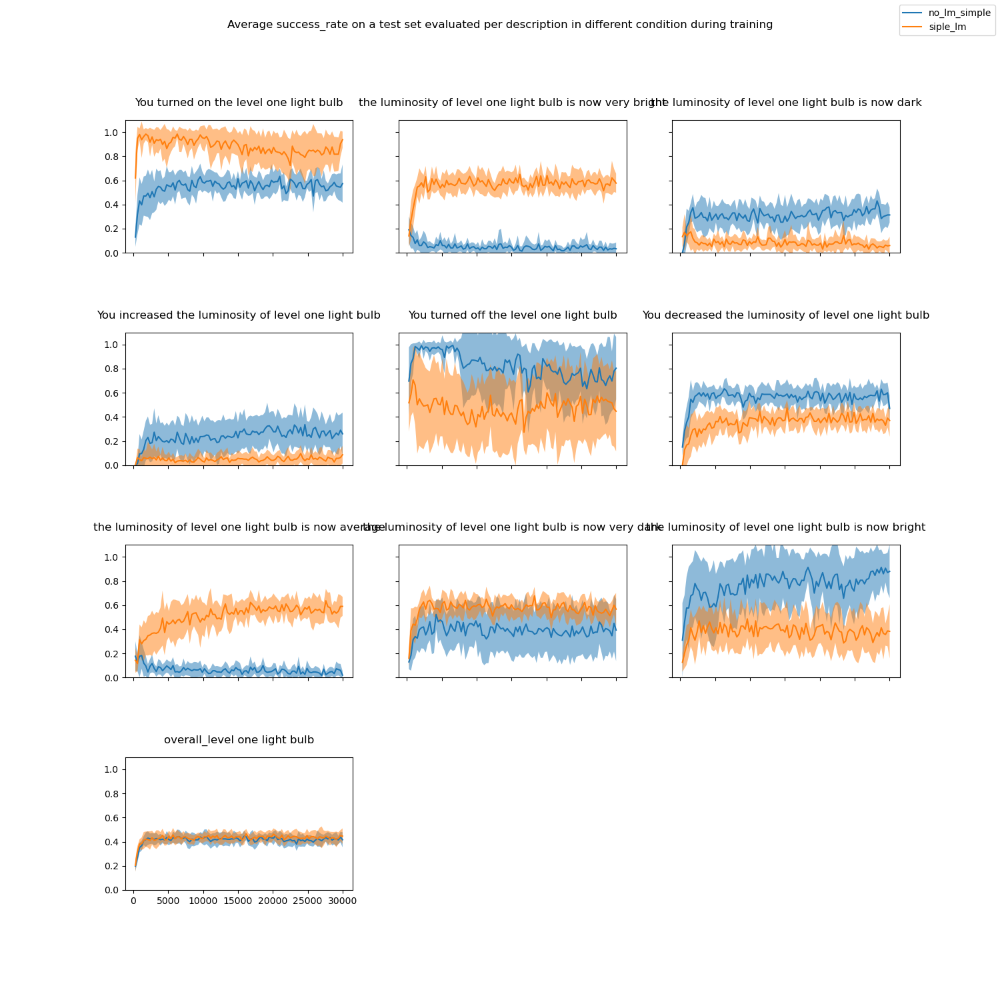

'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_8/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_9/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_1/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_2/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_0/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_7/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_4/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_6/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_3/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_5/test_record.jbl'
done
************************************ ['no_lm_simpl

In [21]:
s = 'no_lm_simple'
f6 = (s, glob.glob(f'results/simulation_simple_lightbulb_no_lm/*'))

s = 'siple_lm'
f7 = (s,glob.glob(f'results/simulation_simple_lightbulb_lm/*'))

# s = 'smooth_no_pretrained'
# f8 = (s,glob.glob(f'results/batch_{s}/*'))

# s = 'smooth_pretrained'
# f9 = (s,glob.glob(f'results/batch_{s}/*'))

fig, axes = compare_average_success_rate(f6, f7)

In [24]:
s = 'two_lightbulb_no_lm'
f6 = (s, glob.glob(f'results/simulation_two_lightbulb_no_lm/*'))

s = 'three_lightbulb_no_lm'
f7 = (s,glob.glob(f'results/simulation_three_lightbulb_no_lm/*'))

# s = 'smooth_no_pretrained'
# f8 = (s,glob.glob(f'results/batch_{s}/*'))

# s = 'smooth_pretrained'
# f9 = (s,glob.glob(f'results/batch_{s}/*'))

fig, axes = compare_average_success_rate(f6, f7)

'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_12/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_9/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_11/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_8/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_13/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_7/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_6/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_10/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_14/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_15/test_record.jbl'
done


<IPython.core.display.Javascript object>

'results/simulation_three_lightbulb_no_lm/simulation_three_lightbulb_no_lm_4/test_record.jbl'
done
'results/simulation_three_lightbulb_no_lm/simulation_three_lightbulb_no_lm_3/test_record.jbl'
done
'results/simulation_three_lightbulb_no_lm/simulation_three_lightbulb_no_lm_1/test_record.jbl'
done
'results/simulation_three_lightbulb_no_lm/simulation_three_lightbulb_no_lm_5/test_record.jbl'
done
'results/simulation_three_lightbulb_no_lm/simulation_three_lightbulb_no_lm_0/test_record.jbl'
done
'results/simulation_three_lightbulb_no_lm/simulation_three_lightbulb_no_lm_6/test_record.jbl'
done
'results/simulation_three_lightbulb_no_lm/simulation_three_lightbulb_no_lm_2/test_record.jbl'
done
'results/simulation_three_lightbulb_no_lm/simulation_three_lightbulb_no_lm_9/test_record.jbl'
done


IndexError: index 9 is out of bounds for axis 0 with size 9

In [19]:
glob.glob(f'results/simulation_simple_lightbulb_no_lm*')

['results/simulation_simple_lightbulb_no_lm']

In [17]:
%ls

 Draft.ipynb   README.md        'Results analysis.ipynb'   src/
 figures/      requirement.yml  'Reward Function .ipynb'
 model/        results/         'RL4IoT protocole.odt'


<IPython.core.display.Javascript object>


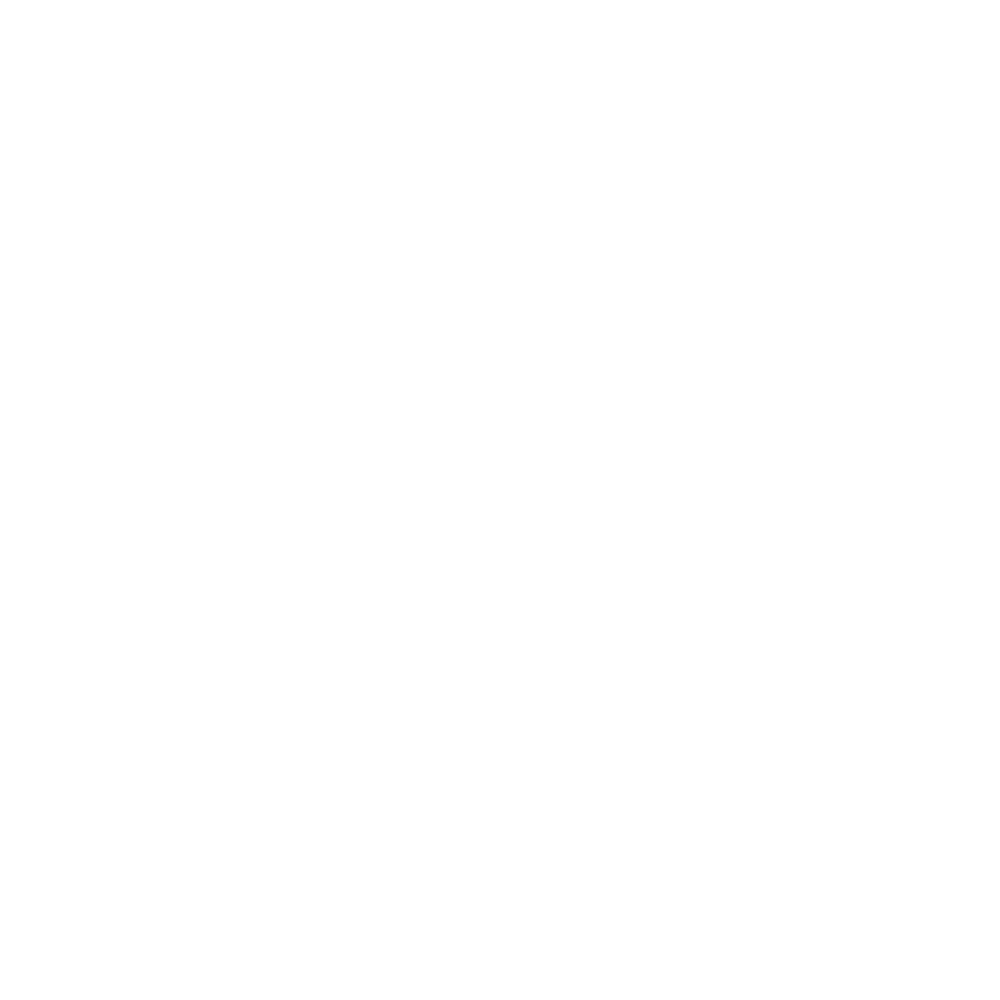

ValueError: Number of rows must be a positive integer, not 0

In [5]:
s = 'test'
f6 = (s, glob.glob(f'results/tes*'))

fig, axes = compare_average_success_rate(f6)

In [24]:
s = 'simulation_up_target_10'
f6 = (s, glob.glob(f'results/temp/{s}*'))

s = 'simulation_no_clipping_up_target_10_no_per_no_double'
f7 = (s, glob.glob(f'results/temp/{s}*'))

# s = 'simulation_no_clipping_up_target_10_no_per'
# f8 = (s, glob.glob(f'results/temp/{s}*'))

# s = 'simulation_no_clipping_up_target_10'
# f9 = (s, glob.glob(f'results/temp/{s}*'))

fig, axes = compare_average_success_rate(f6, f7, f8, f9)

'results/temp/simulation_up_target_10_2/test_record.jbl'
done
'results/temp/simulation_up_target_10_0/test_record.jbl'
done
'results/temp/simulation_up_target_10_1/test_record.jbl'
done
'results/temp/simulation_up_target_10_3/test_record.jbl'
done


<IPython.core.display.Javascript object>

'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_2/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_3/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_0/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_1/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_2/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_2/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_3/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_0/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_1/test_record.jbl'


IndexError: list index out of range

In [25]:
glob.glob(f'results/temp/{simulation_name}*/')

[]

In [22]:
simulation_name

'test'

'results/temp/simulation_up_target_10_2/test_record.jbl'
done
'results/temp/simulation_up_target_10_0/test_record.jbl'
done
'results/temp/simulation_up_target_10_1/test_record.jbl'
done
'results/temp/simulation_up_target_10_3/test_record.jbl'
done


<IPython.core.display.Javascript object>


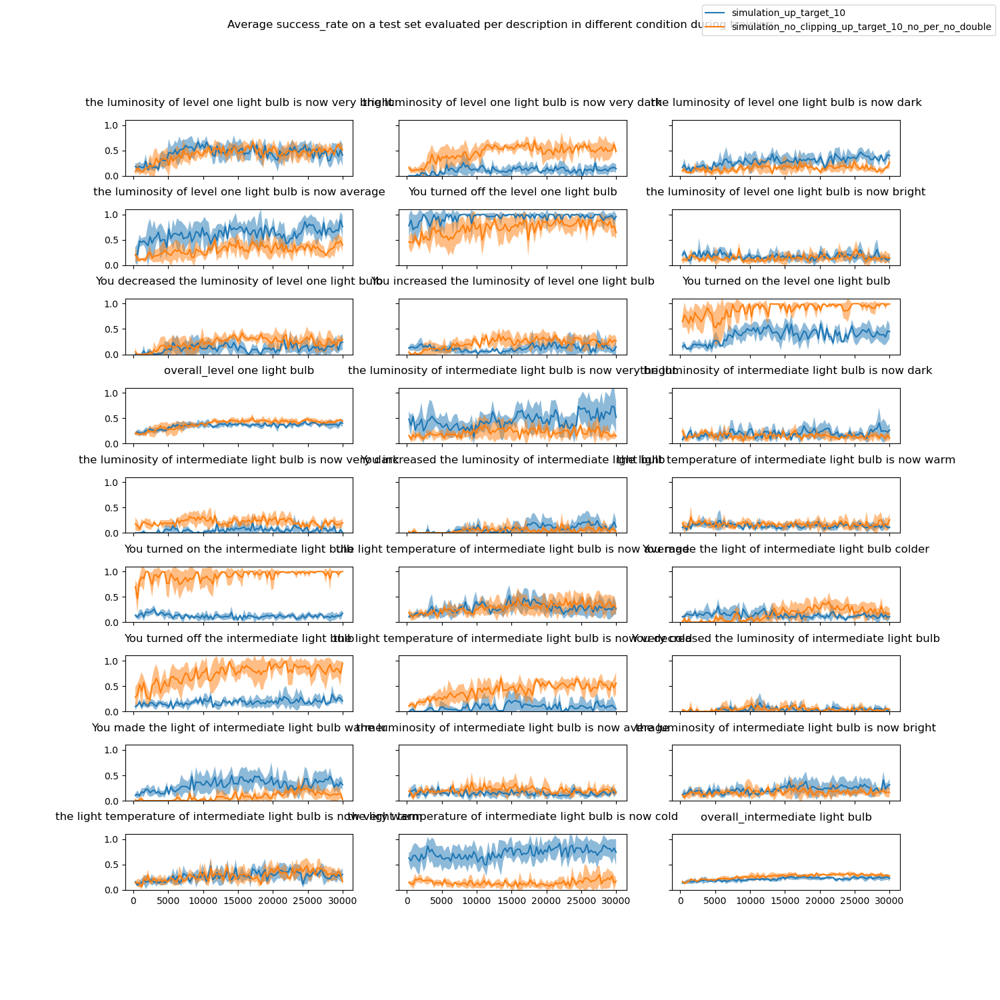

'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_2/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_3/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_0/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_1/test_record.jbl'
done
************************************ ['simulation_up_target_10', 'simulation_no_clipping_up_target_10_no_per_no_double']


In [11]:
s = 'simulation_up_target_10'
f6 = (s, glob.glob(f'results/temp/{s}*'))

s = 'simulation_no_clipping_up_target_10_no_per_no_double'
f7 = (s, glob.glob(f'results/temp/{s}*'))

# s = 'simulation_no_clipping_up_target_10_no_per'
# f8 = (s, glob.glob(f'results/temp/{s}*'))

# s = 'simulation_no_clipping_up_target_10'
# f9 = (s, glob.glob(f'results/temp/{s}*'))

fig, axes = compare_average_success_rate(f6, f7)